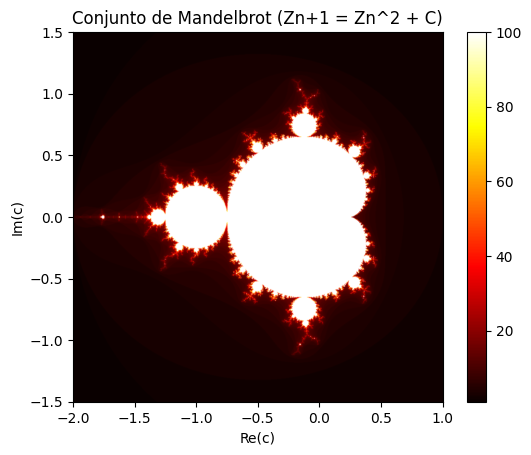

In [11]:
import numpy as np
import matplotlib.pyplot as plt

def mandelbrot(c, max_iter):
    z = 0
    n = 0
    while abs(z) <= 2 and n < max_iter:
        z = z**2 + c  # Aquí se suma C en cada iteración
        n += 1
    return n

def mandelbrot_set(width, height, x_min, x_max, y_min, y_max, max_iter):
    x = np.linspace(x_min, x_max, width)
    y = np.linspace(y_min, y_max, height)
    mandelbrot_grid = np.zeros((height, width))

    for i in range(height):
        for j in range(width):
            c = x[j] + y[i] * 1j  # Define el número complejo C
            mandelbrot_grid[i, j] = mandelbrot(c, max_iter)

    return mandelbrot_grid

def plot_mandelbrot(width, height, x_min, x_max, y_min, y_max, max_iter):
    mandelbrot_grid = mandelbrot_set(width, height, x_min, x_max, y_min, y_max, max_iter)
    plt.imshow(mandelbrot_grid, extent=(x_min, x_max, y_min, y_max), cmap='hot', interpolation='bilinear')
    plt.colorbar()
    plt.title("Conjunto de Mandelbrot (Zn+1 = Zn^2 + C)")
    plt.xlabel("Re(c)")
    plt.ylabel("Im(c)")
    plt.show()

# Parámetros para la visualización
width, height = 800, 800
x_min, x_max = -2.0, 1.0  # Rango en el eje real
y_min, y_max = -1.5, 1.5  # Rango en el eje imaginario
max_iter = 100  # Número máximo de iteraciones

# Generar y mostrar el conjunto de Mandelbrot
plot_mandelbrot(width, height, x_min, x_max, y_min, y_max, max_iter)

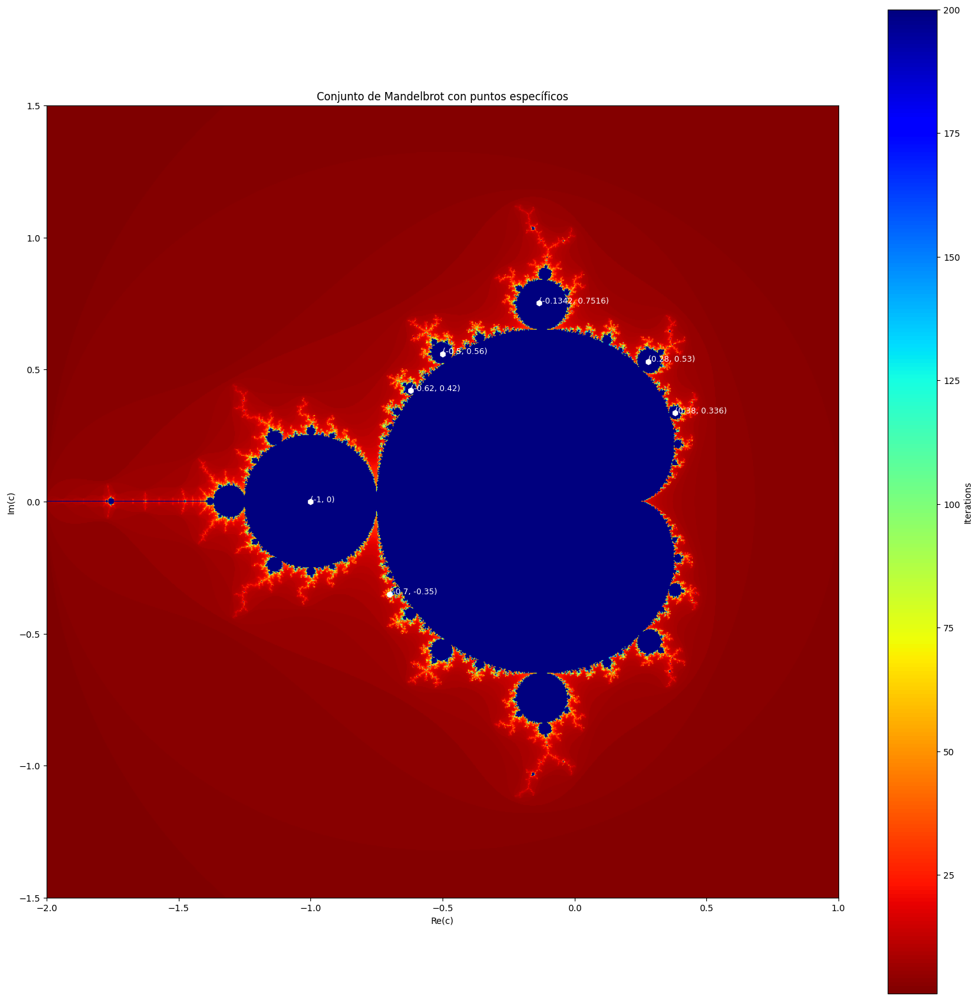

In [46]:
import numpy as np
import matplotlib.pyplot as plt

# Definir la función para calcular el conjunto de Mandelbrot
def mandelbrot(c, max_iter):
    z = 0
    n = 0
    while abs(z) <= 2 and n < max_iter:
        z = z*z + c
        n += 1
    return n

# Definir la resolución y el rango de la gráfica
width, height = 1000, 1000
x_min, x_max = -2.0, 1.0
y_min, y_max = -1.5, 1.5

# Crear una imagen vacía
image = np.zeros((height, width))

# Generar el conjunto de Mandelbrot
max_iter = 200
for row in range(height):
    for col in range(width):
        x0 = x_min + (x_max - x_min) * col / width
        y0 = y_min + (y_max - y_min) * row / height
        c = complex(x0, y0)
        m = mandelbrot(c, max_iter)
        image[row, col] = m

# Mostrar la imagen del conjunto de Mandelbrot
plt.figure(figsize=(20, 20))
plt.imshow(image, extent=(x_min, x_max, y_min, y_max), cmap='jet_r', origin='lower')
plt.colorbar(label='Iterations')

# Definir los puntos a graficar
points = [(-1, 0), (-0.1342, 0.7516), (0.28, 0.53), (-0.5, 0.56), (0.38, 0.336), (-0.62, 0.42), (-0.70, -0.35)]

# Graficar los puntos
for (x, y) in points:
    plt.plot(x, y, 'wh')  # 'bo' significa puntos azules
    plt.text(x, y, f'({x}, {y})', fontsize=9, color='white')

# Mostrar la gráfica
plt.title('Conjunto de Mandelbrot con puntos específicos')
plt.xlabel('Re(c)')
plt.ylabel('Im(c)')
plt.show()

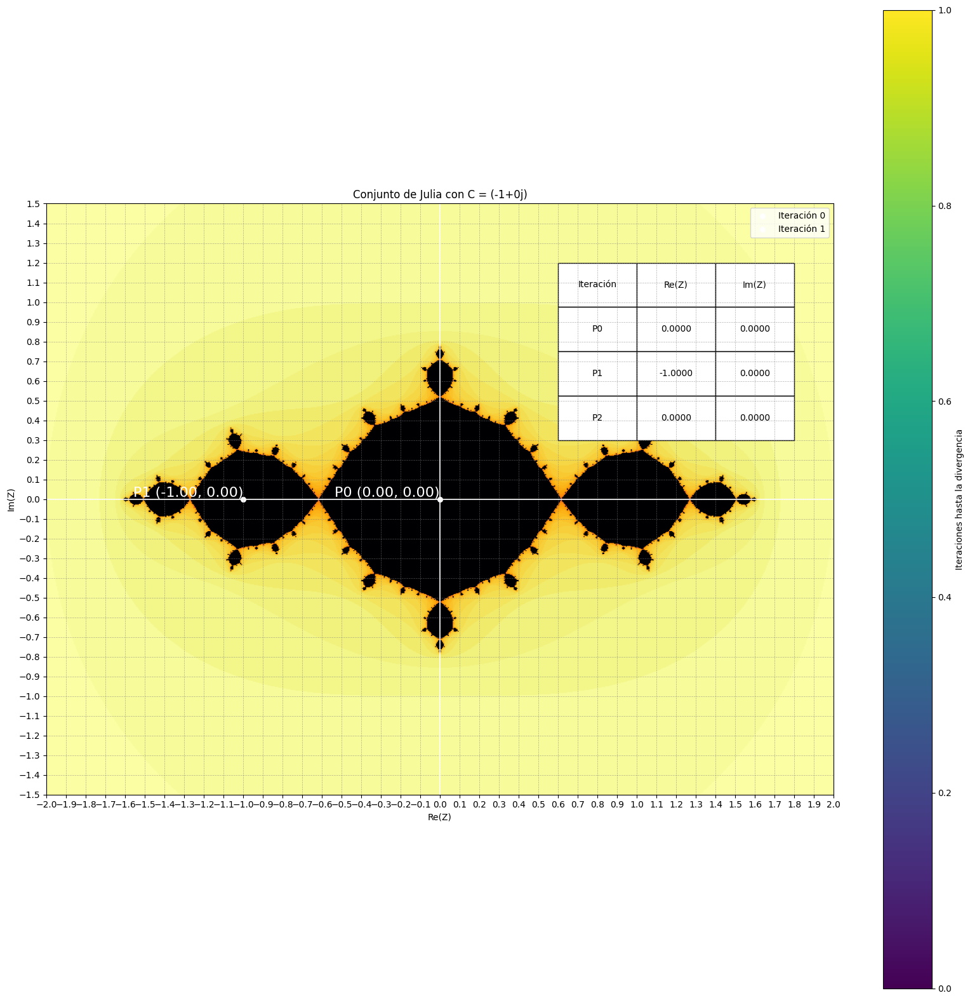

In [2]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la imagen
width, height = 800, 800
x_min, x_max = -2.0, 2.0
y_min, y_max = -1.5, 1.5
max_iter = 70  # Número máximo de iteraciones

# Definir un valor fijo para C
C_fixed = complex(-1, 0)

# Crear la cuadrícula de valores complejos
x_values = np.linspace(x_min, x_max, width)
y_values = np.linspace(y_min, y_max, height)
mandelbrot_set = np.zeros((height, width))

for i, y in enumerate(y_values):
    for j, x in enumerate(x_values):
        Z = complex(x, y)  # Cada punto en la cuadrícula
        C = C_fixed  # Se usa el mismo C en todas las iteraciones
        iter_count = 0
        while abs(Z) <= 2 and iter_count < max_iter:
            Z = Z**2 + C
            iter_count += 1
        mandelbrot_set[i, j] = iter_count

# Calcular las primeras 4 iteraciones de Z_n para C_fixed
C = C_fixed
Z = complex(0, 0)  # Z0
iterations = [(Z.real, Z.imag)]  # Lista para almacenar las coordenadas de las iteraciones
for i in range(2):
    Z = Z**2 + C
    iterations.append((Z.real, Z.imag))

# Graficar el conjunto de Julia
plt.figure(figsize=(20, 20))
plt.imshow(mandelbrot_set, extent=[x_min, x_max, y_min, y_max], cmap='inferno_r', origin='lower')

# Agregar las primeras 4 iteraciones como puntos rojos
for i, (x, y) in enumerate(iterations[:-1]):
    if x_min <= x <= x_max and y_min <= y <= y_max:  # Asegurar que esté dentro del área de la imagen
        plt.scatter(x, y, color='white', marker='o', s=30, label=f'Iteración {i}')
        plt.text(x, y, f'P{i} ({x:.2f}, {y:.2f})', fontsize=16, color='white', ha='right', va='bottom')

# Agregar cuadrícula y ejes cartesianos
plt.axhline(0, color='white', linewidth=1.2)  # Eje X
plt.axvline(0, color='white', linewidth=1.2)  # Eje Y
plt.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.6)  # Cuadrícula

# Establecer marcas en los ejes cada 0.1 unidades
plt.xticks(np.arange(x_min, x_max + 0.1, 0.1))
plt.yticks(np.arange(y_min, y_max + 0.1, 0.1))

# Etiquetas
plt.colorbar(label="Iteraciones hasta la divergencia")
plt.title(f"Conjunto de Julia con C = {C_fixed}")
plt.xlabel("Re(Z)")
plt.ylabel("Im(Z)")
plt.legend()

# Mostrar la gráfica
col_labels = ["Iteración", "Re(Z)", "Im(Z)"]
table_data = [(f'P{i}', f'{x:.4f}', f'{y:.4f}') for i, (x, y) in enumerate(iterations)]
table = plt.table(cellText=table_data, colLabels=col_labels, cellLoc='center', loc='upper right', bbox=[0.65, 0.6, 0.3, 0.3])
table.auto_set_font_size(False)
table.set_fontsize(10)

plt.show()

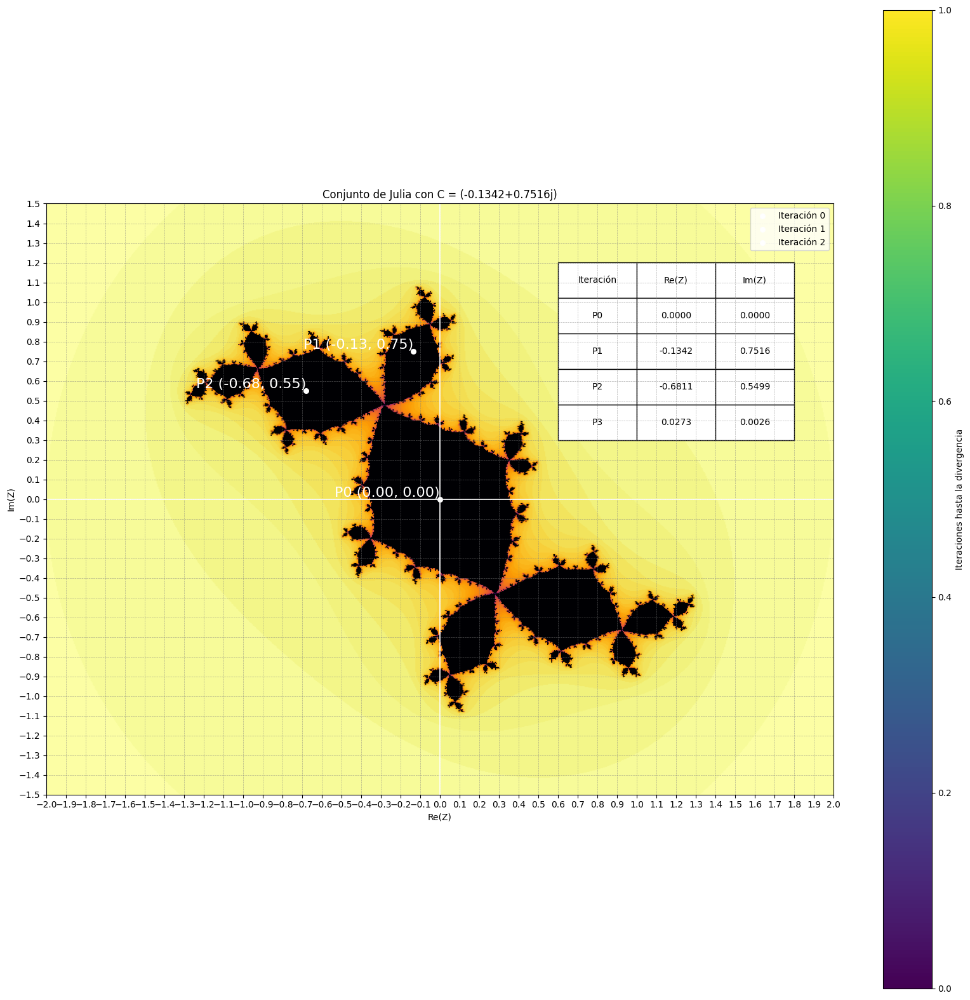

In [4]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la imagen
width, height = 800, 800
x_min, x_max = -2.0, 2.0
y_min, y_max = -1.5, 1.5
max_iter = 70  # Número máximo de iteraciones

# Definir un valor fijo para C
C_fixed = complex(-0.1342, 0.7516)

# Crear la cuadrícula de valores complejos
x_values = np.linspace(x_min, x_max, width)
y_values = np.linspace(y_min, y_max, height)
mandelbrot_set = np.zeros((height, width))

for i, y in enumerate(y_values):
    for j, x in enumerate(x_values):
        Z = complex(x, y)  # Cada punto en la cuadrícula
        C = C_fixed  # Se usa el mismo C en todas las iteraciones
        iter_count = 0
        while abs(Z) <= 2 and iter_count < max_iter:
            Z = Z**2 + C
            iter_count += 1
        mandelbrot_set[i, j] = iter_count

# Calcular las primeras 4 iteraciones de Z_n para C_fixed
C = C_fixed
Z = complex(0, 0)  # Z0
iterations = [(Z.real, Z.imag)]  # Lista para almacenar las coordenadas de las iteraciones
for i in range(3):
    Z = Z**2 + C
    iterations.append((Z.real, Z.imag))

# Graficar el conjunto de Julia
plt.figure(figsize=(20, 20))
plt.imshow(mandelbrot_set, extent=[x_min, x_max, y_min, y_max], cmap='inferno_r', origin='lower')

# Agregar las primeras 4 iteraciones como puntos rojos
for i, (x, y) in enumerate(iterations[:-1]):
    if x_min <= x <= x_max and y_min <= y <= y_max:  # Asegurar que esté dentro del área de la imagen
        plt.scatter(x, y, color='white', marker='o', s=30, label=f'Iteración {i}')
        plt.text(x, y, f'P{i} ({x:.2f}, {y:.2f})', fontsize=16, color='white', ha='right', va='bottom')

# Agregar cuadrícula y ejes cartesianos
plt.axhline(0, color='white', linewidth=1.2)  # Eje X
plt.axvline(0, color='white', linewidth=1.2)  # Eje Y
plt.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.6)  # Cuadrícula

# Establecer marcas en los ejes cada 0.1 unidades
plt.xticks(np.arange(x_min, x_max + 0.1, 0.1))
plt.yticks(np.arange(y_min, y_max + 0.1, 0.1))

# Etiquetas
plt.colorbar(label="Iteraciones hasta la divergencia")
plt.title(f"Conjunto de Julia con C = {C_fixed}")
plt.xlabel("Re(Z)")
plt.ylabel("Im(Z)")
plt.legend()

# Mostrar la gráfica
col_labels = ["Iteración", "Re(Z)", "Im(Z)"]
table_data = [(f'P{i}', f'{x:.4f}', f'{y:.4f}') for i, (x, y) in enumerate(iterations)]
table = plt.table(cellText=table_data, colLabels=col_labels, cellLoc='center', loc='upper right', bbox=[0.65, 0.6, 0.3, 0.3])
table.auto_set_font_size(False)
table.set_fontsize(10)

plt.show()

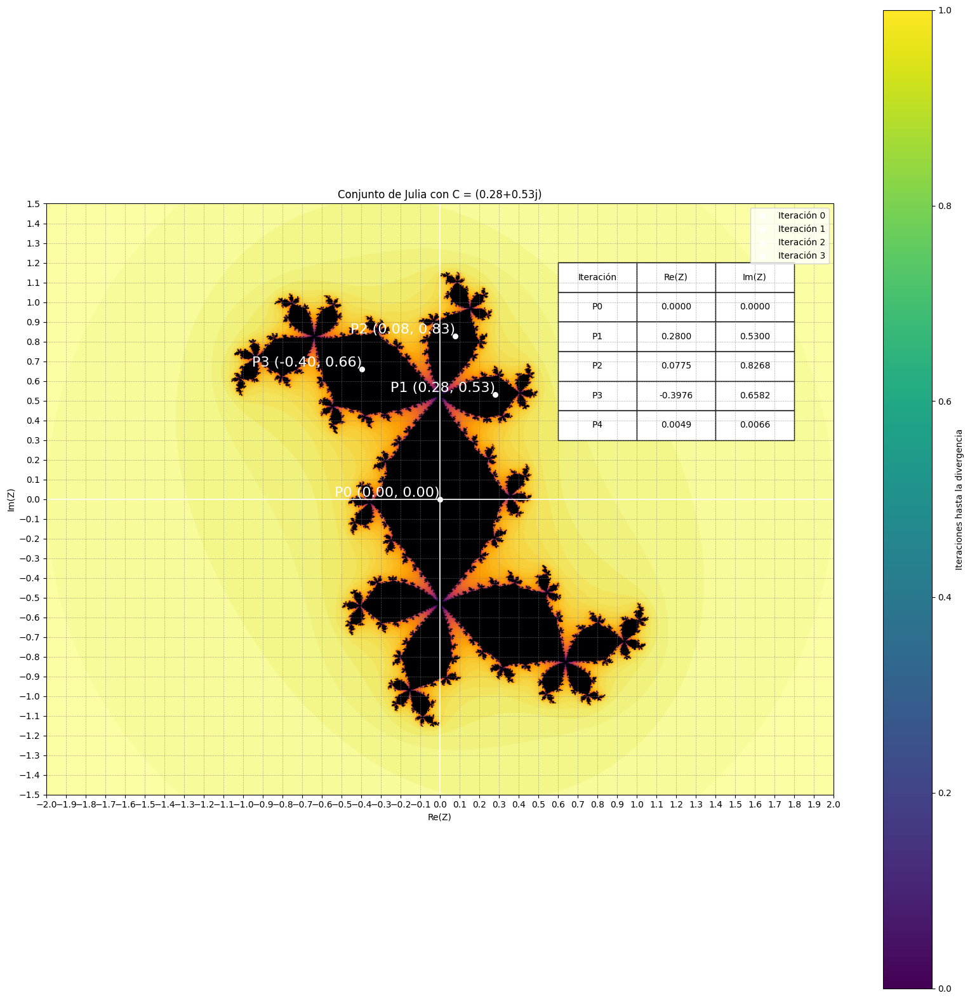

In [6]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la imagen
width, height = 800, 800
x_min, x_max = -2.0, 2.0
y_min, y_max = -1.5, 1.5
max_iter = 70  # Número máximo de iteraciones

# Definir un valor fijo para C
C_fixed = complex(0.28, 0.53)

# Crear la cuadrícula de valores complejos
x_values = np.linspace(x_min, x_max, width)
y_values = np.linspace(y_min, y_max, height)
mandelbrot_set = np.zeros((height, width))

for i, y in enumerate(y_values):
    for j, x in enumerate(x_values):
        Z = complex(x, y)  # Cada punto en la cuadrícula
        C = C_fixed  # Se usa el mismo C en todas las iteraciones
        iter_count = 0
        while abs(Z) <= 2 and iter_count < max_iter:
            Z = Z**2 + C
            iter_count += 1
        mandelbrot_set[i, j] = iter_count

# Calcular las primeras 4 iteraciones de Z_n para C_fixed
C = C_fixed
Z = complex(0, 0)  # Z0
iterations = [(Z.real, Z.imag)]  # Lista para almacenar las coordenadas de las iteraciones
for i in range(4):
    Z = Z**2 + C
    iterations.append((Z.real, Z.imag))

# Graficar el conjunto de Julia
plt.figure(figsize=(20, 20))
plt.imshow(mandelbrot_set, extent=[x_min, x_max, y_min, y_max], cmap='inferno_r', origin='lower')

# Agregar las primeras 4 iteraciones como puntos rojos
for i, (x, y) in enumerate(iterations[:-1]):
    if x_min <= x <= x_max and y_min <= y <= y_max:  # Asegurar que esté dentro del área de la imagen
        plt.scatter(x, y, color='white', marker='o', s=30, label=f'Iteración {i}')
        plt.text(x, y, f'P{i} ({x:.2f}, {y:.2f})', fontsize=16, color='white', ha='right', va='bottom')

# Agregar cuadrícula y ejes cartesianos
plt.axhline(0, color='white', linewidth=1.2)  # Eje X
plt.axvline(0, color='white', linewidth=1.2)  # Eje Y
plt.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.6)  # Cuadrícula

# Establecer marcas en los ejes cada 0.1 unidades
plt.xticks(np.arange(x_min, x_max + 0.1, 0.1))
plt.yticks(np.arange(y_min, y_max + 0.1, 0.1))

# Etiquetas
plt.colorbar(label="Iteraciones hasta la divergencia")
plt.title(f"Conjunto de Julia con C = {C_fixed}")
plt.xlabel("Re(Z)")
plt.ylabel("Im(Z)")
plt.legend()

# Mostrar la gráfica
col_labels = ["Iteración", "Re(Z)", "Im(Z)"]
table_data = [(f'P{i}', f'{x:.4f}', f'{y:.4f}') for i, (x, y) in enumerate(iterations)]
table = plt.table(cellText=table_data, colLabels=col_labels, cellLoc='center', loc='upper right', bbox=[0.65, 0.6, 0.3, 0.3])
table.auto_set_font_size(False)
table.set_fontsize(10)

plt.show()

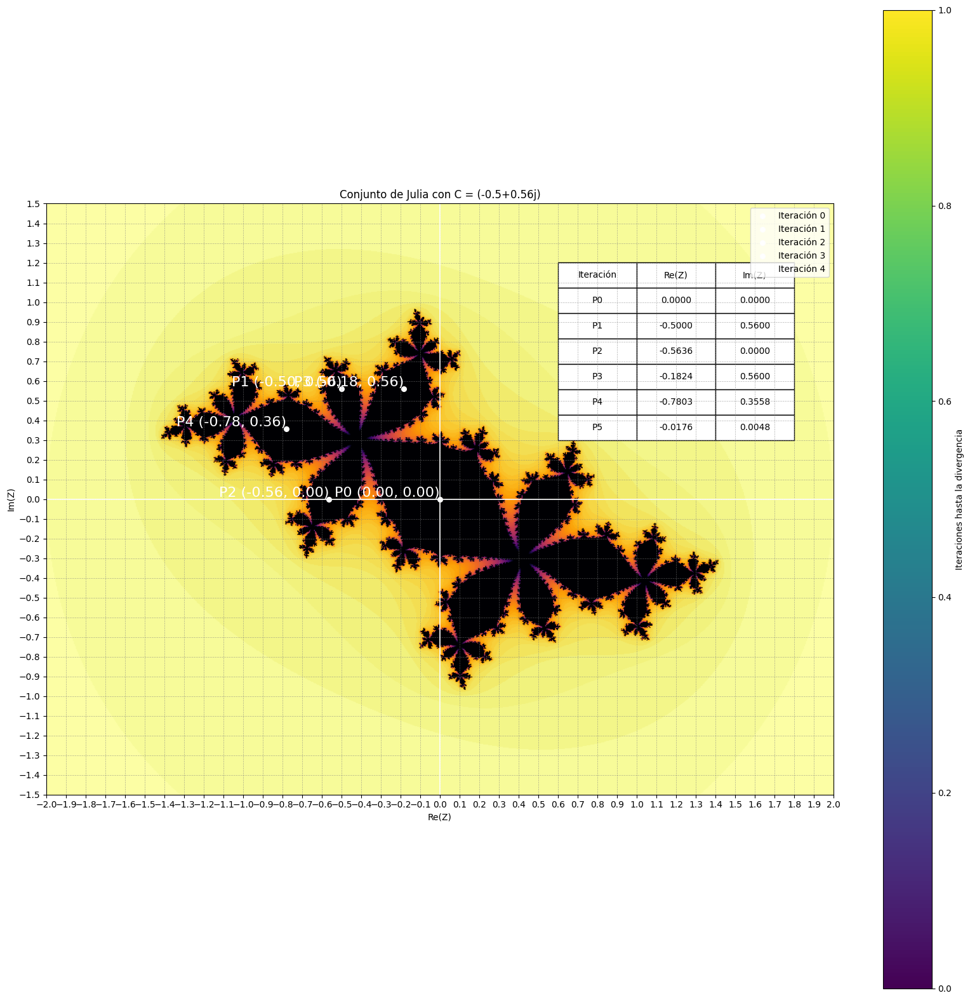

In [8]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la imagen
width, height = 800, 800
x_min, x_max = -2.0, 2.0
y_min, y_max = -1.5, 1.5
max_iter = 70  # Número máximo de iteraciones

# Definir un valor fijo para C
C_fixed = complex(-0.5, 0.56)

# Crear la cuadrícula de valores complejos
x_values = np.linspace(x_min, x_max, width)
y_values = np.linspace(y_min, y_max, height)
mandelbrot_set = np.zeros((height, width))

for i, y in enumerate(y_values):
    for j, x in enumerate(x_values):
        Z = complex(x, y)  # Cada punto en la cuadrícula
        C = C_fixed  # Se usa el mismo C en todas las iteraciones
        iter_count = 0
        while abs(Z) <= 2 and iter_count < max_iter:
            Z = Z**2 + C
            iter_count += 1
        mandelbrot_set[i, j] = iter_count

# Calcular las primeras 4 iteraciones de Z_n para C_fixed
C = C_fixed
Z = complex(0, 0)  # Z0
iterations = [(Z.real, Z.imag)]  # Lista para almacenar las coordenadas de las iteraciones
for i in range(5):
    Z = Z**2 + C
    iterations.append((Z.real, Z.imag))

# Graficar el conjunto de Julia
plt.figure(figsize=(20, 20))
plt.imshow(mandelbrot_set, extent=[x_min, x_max, y_min, y_max], cmap='inferno_r', origin='lower')

# Agregar las primeras 4 iteraciones como puntos rojos
for i, (x, y) in enumerate(iterations[:-1]):
    if x_min <= x <= x_max and y_min <= y <= y_max:  # Asegurar que esté dentro del área de la imagen
        plt.scatter(x, y, color='white', marker='o', s=30, label=f'Iteración {i}')
        plt.text(x, y, f'P{i} ({x:.2f}, {y:.2f})', fontsize=16, color='white', ha='right', va='bottom')

# Agregar cuadrícula y ejes cartesianos
plt.axhline(0, color='white', linewidth=1.2)  # Eje X
plt.axvline(0, color='white', linewidth=1.2)  # Eje Y
plt.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.6)  # Cuadrícula

# Establecer marcas en los ejes cada 0.1 unidades
plt.xticks(np.arange(x_min, x_max + 0.1, 0.1))
plt.yticks(np.arange(y_min, y_max + 0.1, 0.1))

# Etiquetas
plt.colorbar(label="Iteraciones hasta la divergencia")
plt.title(f"Conjunto de Julia con C = {C_fixed}")
plt.xlabel("Re(Z)")
plt.ylabel("Im(Z)")
plt.legend()

# Mostrar la gráfica
col_labels = ["Iteración", "Re(Z)", "Im(Z)"]
table_data = [(f'P{i}', f'{x:.4f}', f'{y:.4f}') for i, (x, y) in enumerate(iterations)]
table = plt.table(cellText=table_data, colLabels=col_labels, cellLoc='center', loc='upper right', bbox=[0.65, 0.6, 0.3, 0.3])
table.auto_set_font_size(False)
table.set_fontsize(10)

plt.show()

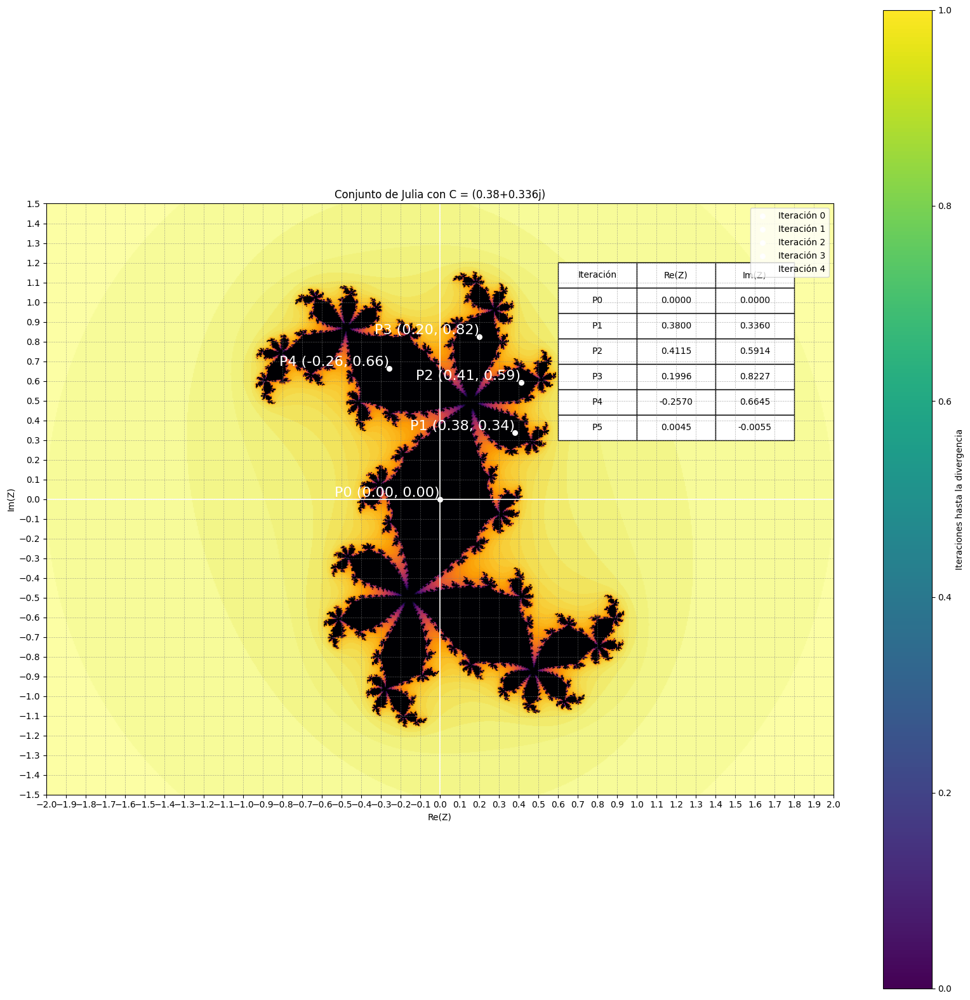

In [9]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la imagen
width, height = 800, 800
x_min, x_max = -2.0, 2.0
y_min, y_max = -1.5, 1.5
max_iter = 70  # Número máximo de iteraciones

# Definir un valor fijo para C
C_fixed = complex(0.38, 0.336)

# Crear la cuadrícula de valores complejos
x_values = np.linspace(x_min, x_max, width)
y_values = np.linspace(y_min, y_max, height)
mandelbrot_set = np.zeros((height, width))

for i, y in enumerate(y_values):
    for j, x in enumerate(x_values):
        Z = complex(x, y)  # Cada punto en la cuadrícula
        C = C_fixed  # Se usa el mismo C en todas las iteraciones
        iter_count = 0
        while abs(Z) <= 2 and iter_count < max_iter:
            Z = Z**2 + C
            iter_count += 1
        mandelbrot_set[i, j] = iter_count

# Calcular las primeras 4 iteraciones de Z_n para C_fixed
C = C_fixed
Z = complex(0, 0)  # Z0
iterations = [(Z.real, Z.imag)]  # Lista para almacenar las coordenadas de las iteraciones
for i in range(5):
    Z = Z**2 + C
    iterations.append((Z.real, Z.imag))

# Graficar el conjunto de Julia
plt.figure(figsize=(20, 20))
plt.imshow(mandelbrot_set, extent=[x_min, x_max, y_min, y_max], cmap='inferno_r', origin='lower')

# Agregar las primeras 4 iteraciones como puntos rojos
for i, (x, y) in enumerate(iterations[:-1]):
    if x_min <= x <= x_max and y_min <= y <= y_max:  # Asegurar que esté dentro del área de la imagen
        plt.scatter(x, y, color='white', marker='o', s=30, label=f'Iteración {i}')
        plt.text(x, y, f'P{i} ({x:.2f}, {y:.2f})', fontsize=16, color='white', ha='right', va='bottom')

# Agregar cuadrícula y ejes cartesianos
plt.axhline(0, color='white', linewidth=1.2)  # Eje X
plt.axvline(0, color='white', linewidth=1.2)  # Eje Y
plt.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.6)  # Cuadrícula

# Establecer marcas en los ejes cada 0.1 unidades
plt.xticks(np.arange(x_min, x_max + 0.1, 0.1))
plt.yticks(np.arange(y_min, y_max + 0.1, 0.1))

# Etiquetas
plt.colorbar(label="Iteraciones hasta la divergencia")
plt.title(f"Conjunto de Julia con C = {C_fixed}")
plt.xlabel("Re(Z)")
plt.ylabel("Im(Z)")
plt.legend()

# Mostrar la gráfica
col_labels = ["Iteración", "Re(Z)", "Im(Z)"]
table_data = [(f'P{i}', f'{x:.4f}', f'{y:.4f}') for i, (x, y) in enumerate(iterations)]
table = plt.table(cellText=table_data, colLabels=col_labels, cellLoc='center', loc='upper right', bbox=[0.65, 0.6, 0.3, 0.3])
table.auto_set_font_size(False)
table.set_fontsize(10)

plt.show()

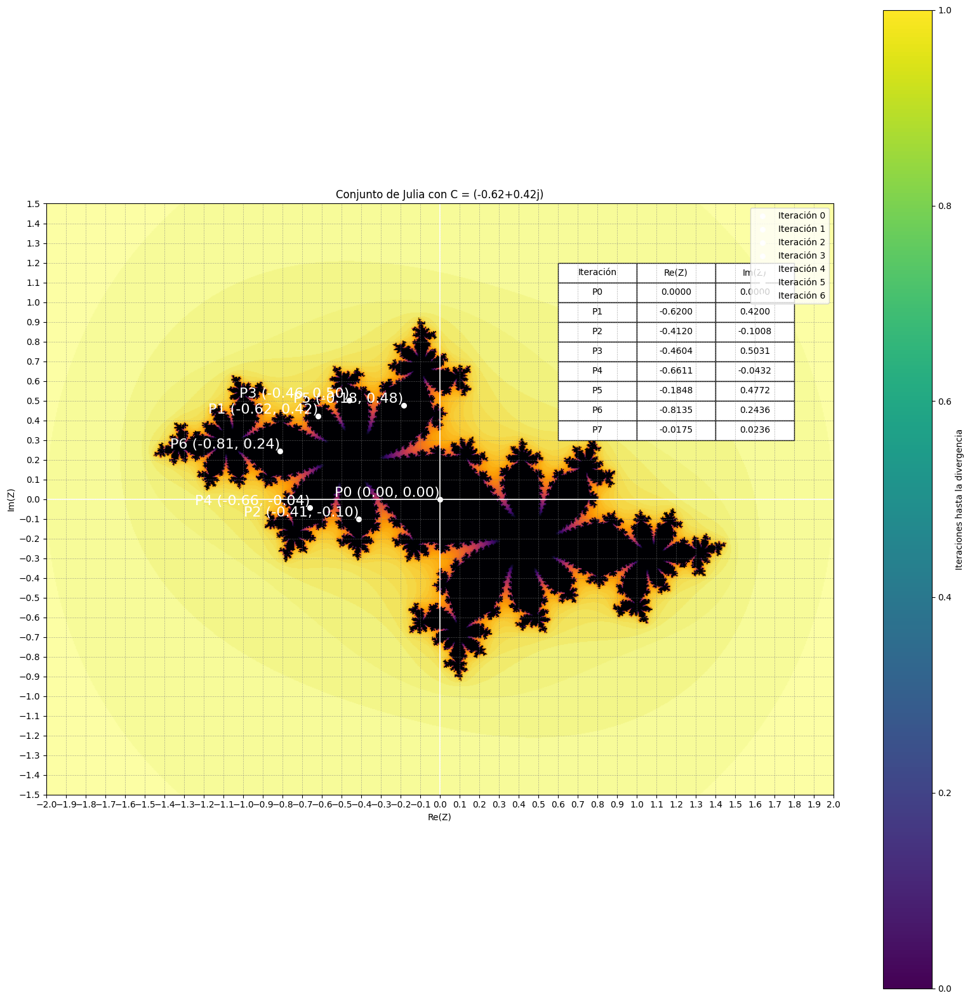

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la imagen
width, height = 800, 800
x_min, x_max = -2.0, 2.0
y_min, y_max = -1.5, 1.5
max_iter = 70  # Número máximo de iteraciones

# Definir un valor fijo para C
C_fixed = complex(-0.62, 0.42)

# Crear la cuadrícula de valores complejos
x_values = np.linspace(x_min, x_max, width)
y_values = np.linspace(y_min, y_max, height)
mandelbrot_set = np.zeros((height, width))

for i, y in enumerate(y_values):
    for j, x in enumerate(x_values):
        Z = complex(x, y)  # Cada punto en la cuadrícula
        C = C_fixed  # Se usa el mismo C en todas las iteraciones
        iter_count = 0
        while abs(Z) <= 2 and iter_count < max_iter:
            Z = Z**2 + C
            iter_count += 1
        mandelbrot_set[i, j] = iter_count

# Calcular las primeras 4 iteraciones de Z_n para C_fixed
C = C_fixed
Z = complex(0, 0)  # Z0
iterations = [(Z.real, Z.imag)]  # Lista para almacenar las coordenadas de las iteraciones
for i in range(7):
    Z = Z**2 + C
    iterations.append((Z.real, Z.imag))

# Graficar el conjunto de Julia
plt.figure(figsize=(20, 20))
plt.imshow(mandelbrot_set, extent=[x_min, x_max, y_min, y_max], cmap='inferno_r', origin='lower')

# Agregar las primeras 4 iteraciones como puntos rojos
for i, (x, y) in enumerate(iterations[:-1]):
    if x_min <= x <= x_max and y_min <= y <= y_max:  # Asegurar que esté dentro del área de la imagen
        plt.scatter(x, y, color='white', marker='o', s=30, label=f'Iteración {i}')
        plt.text(x, y, f'P{i} ({x:.2f}, {y:.2f})', fontsize=16, color='white', ha='right', va='bottom')

# Agregar cuadrícula y ejes cartesianos
plt.axhline(0, color='white', linewidth=1.2)  # Eje X
plt.axvline(0, color='white', linewidth=1.2)  # Eje Y
plt.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.6)  # Cuadrícula

# Establecer marcas en los ejes cada 0.1 unidades
plt.xticks(np.arange(x_min, x_max + 0.1, 0.1))
plt.yticks(np.arange(y_min, y_max + 0.1, 0.1))

# Etiquetas
plt.colorbar(label="Iteraciones hasta la divergencia")
plt.title(f"Conjunto de Julia con C = {C_fixed}")
plt.xlabel("Re(Z)")
plt.ylabel("Im(Z)")
plt.legend()

# Mostrar la gráfica
col_labels = ["Iteración", "Re(Z)", "Im(Z)"]
table_data = [(f'P{i}', f'{x:.4f}', f'{y:.4f}') for i, (x, y) in enumerate(iterations)]
table = plt.table(cellText=table_data, colLabels=col_labels, cellLoc='center', loc='upper right', bbox=[0.65, 0.6, 0.3, 0.3])
table.auto_set_font_size(False)
table.set_fontsize(10)

plt.show()

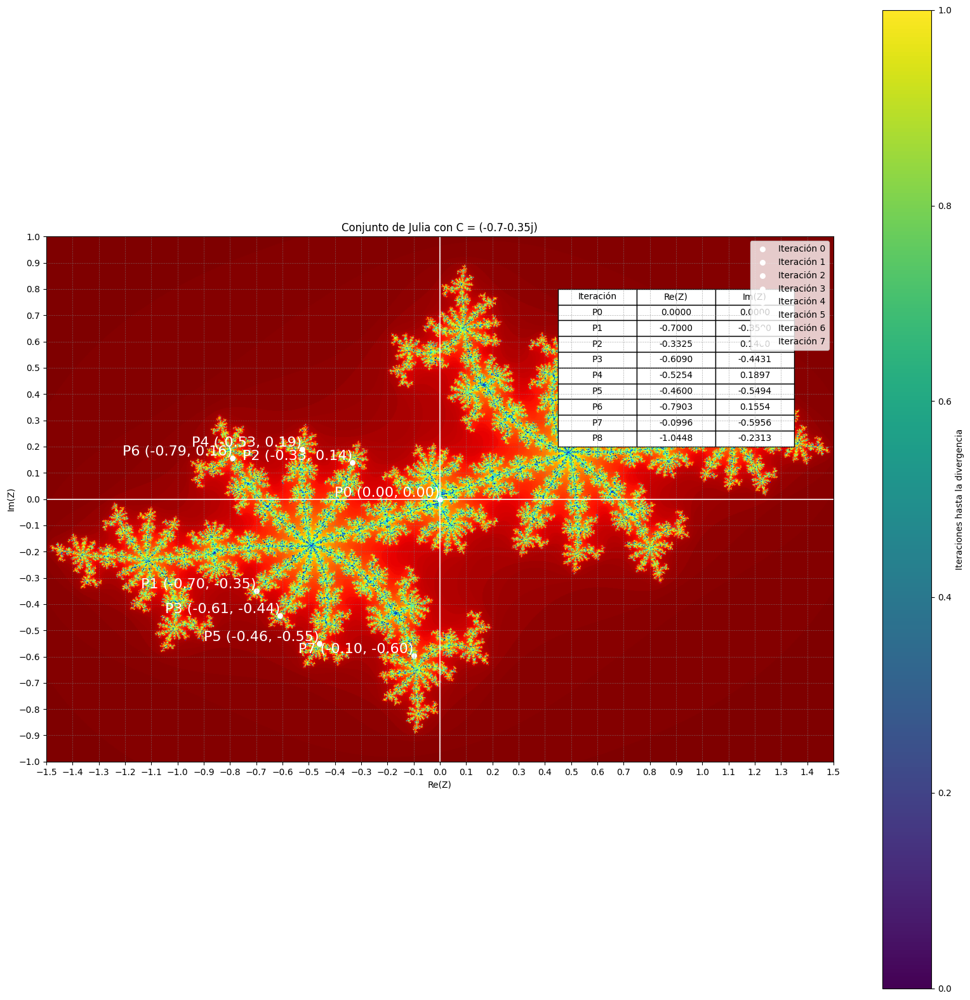

In [39]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la imagen
width, height = 1000, 1000
x_min, x_max = -1.5, 1.5
y_min, y_max = -1, 1
max_iter = 200  # Número máximo de iteraciones

# Definir un valor fijo para C
C_fixed = complex(-0.70, -0.35)

# Crear la cuadrícula de valores complejos
x_values = np.linspace(x_min, x_max, width)
y_values = np.linspace(y_min, y_max, height)
mandelbrot_set = np.zeros((height, width))

for i, y in enumerate(y_values):
    for j, x in enumerate(x_values):
        Z = complex(x, y)  # Cada punto en la cuadrícula
        C = C_fixed  # Se usa el mismo C en todas las iteraciones
        iter_count = 0
        while abs(Z) <= 2 and iter_count < max_iter:
            Z = Z**2 + C
            iter_count += 1
        mandelbrot_set[i, j] = iter_count

# Calcular las primeras 4 iteraciones de Z_n para C_fixed
C = C_fixed
Z = complex(0, 0)  # Z0
iterations = [(Z.real, Z.imag)]  # Lista para almacenar las coordenadas de las iteraciones
for i in range(8):
    Z = Z**2 + C
    iterations.append((Z.real, Z.imag))

# Graficar el conjunto de Julia
plt.figure(figsize=(20, 20))
plt.imshow(mandelbrot_set, extent=[x_min, x_max, y_min, y_max], cmap='jet_r', origin='lower')

# Agregar las primeras 4 iteraciones como puntos rojos
for i, (x, y) in enumerate(iterations[:-1]):
    if x_min <= x <= x_max and y_min <= y <= y_max:  # Asegurar que esté dentro del área de la imagen
        plt.scatter(x, y, color='white', marker='o', s=30, label=f'Iteración {i}')
        plt.text(x, y, f'P{i} ({x:.2f}, {y:.2f})', fontsize=16, color='white', ha='right', va='bottom')

# Agregar cuadrícula y ejes cartesianos
plt.axhline(0, color='white', linewidth=1.2)  # Eje X
plt.axvline(0, color='white', linewidth=1.2)  # Eje Y
plt.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.6)  # Cuadrícula

# Establecer marcas en los ejes cada 0.1 unidades
plt.xticks(np.arange(x_min, x_max + 0.1, 0.1))
plt.yticks(np.arange(y_min, y_max + 0.1, 0.1))

# Etiquetas
plt.colorbar(label="Iteraciones hasta la divergencia")
plt.title(f"Conjunto de Julia con C = {C_fixed}")
plt.xlabel("Re(Z)")
plt.ylabel("Im(Z)")
plt.legend()

# Mostrar la gráfica
col_labels = ["Iteración", "Re(Z)", "Im(Z)"]
table_data = [(f'P{i}', f'{x:.4f}', f'{y:.4f}') for i, (x, y) in enumerate(iterations)]
table = plt.table(cellText=table_data, colLabels=col_labels, cellLoc='center', loc='upper right', bbox=[0.65, 0.6, 0.3, 0.3])
table.auto_set_font_size(False)
table.set_fontsize(10)

plt.show()

**Rango: -2.25<x<1.25 ; -1.5<y<1.5**

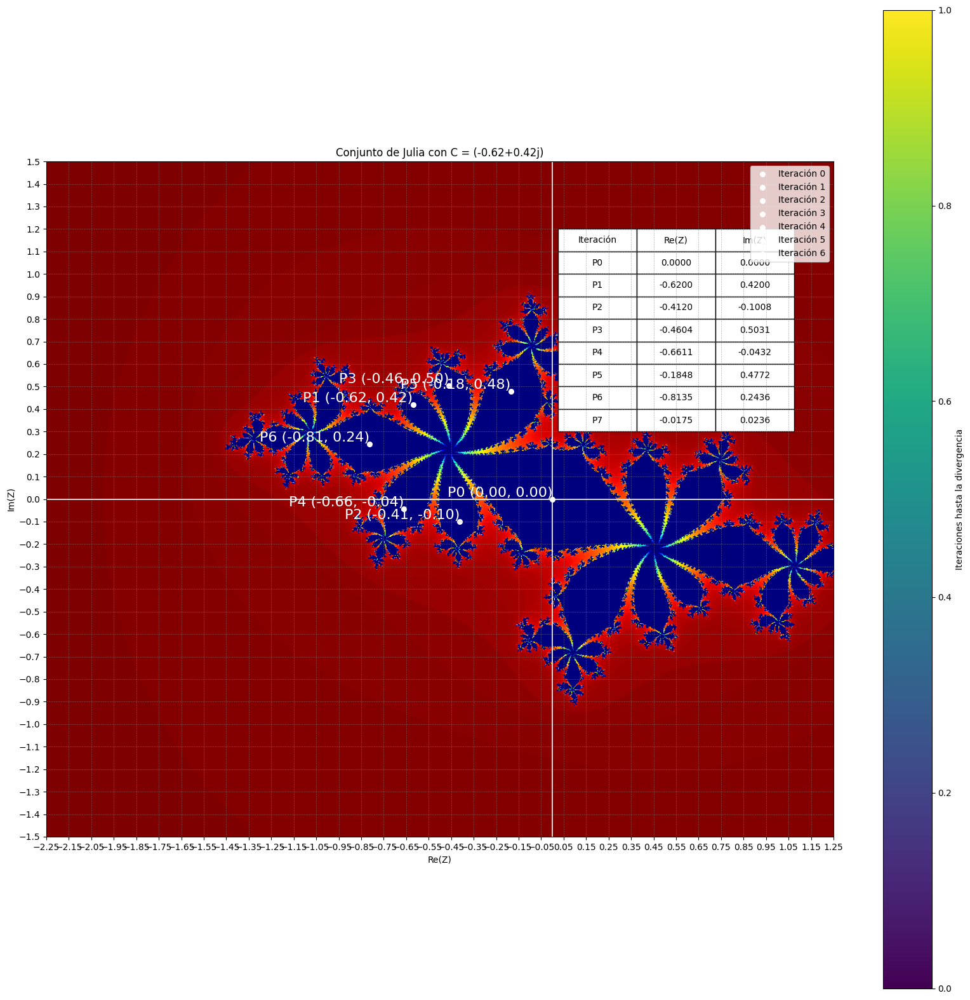

In [31]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la imagen
width, height = 1000, 1000
x_min, x_max = -2.25, 1.25
y_min, y_max = -1.5, 1.5
max_iter = 200  # Número máximo de iteraciones

# Definir un valor fijo para C
C_fixed = complex(-0.62, 0.42)

# Crear la cuadrícula de valores complejos
x_values = np.linspace(x_min, x_max, width)
y_values = np.linspace(y_min, y_max, height)
mandelbrot_set = np.zeros((height, width))

for i, y in enumerate(y_values):
    for j, x in enumerate(x_values):
        Z = complex(x, y)  # Cada punto en la cuadrícula
        C = C_fixed  # Se usa el mismo C en todas las iteraciones
        iter_count = 0
        while abs(Z) <= 2 and iter_count < max_iter:
            Z = Z**2 + C
            iter_count += 1
        mandelbrot_set[i, j] = iter_count

# Calcular las primeras 4 iteraciones de Z_n para C_fixed
C = C_fixed
Z = complex(0, 0)  # Z0
iterations = [(Z.real, Z.imag)]  # Lista para almacenar las coordenadas de las iteraciones
for i in range(7):
    Z = Z**2 + C
    iterations.append((Z.real, Z.imag))

# Graficar el conjunto de Julia
plt.figure(figsize=(20, 20))
plt.imshow(mandelbrot_set, extent=[x_min, x_max, y_min, y_max], cmap='jet_r', origin='lower')

# Agregar las primeras 4 iteraciones como puntos rojos
for i, (x, y) in enumerate(iterations[:-1]):
    if x_min <= x <= x_max and y_min <= y <= y_max:  # Asegurar que esté dentro del área de la imagen
        plt.scatter(x, y, color='white', marker='o', s=30, label=f'Iteración {i}')
        plt.text(x, y, f'P{i} ({x:.2f}, {y:.2f})', fontsize=16, color='white', ha='right', va='bottom')

# Agregar cuadrícula y ejes cartesianos
plt.axhline(0, color='white', linewidth=1.2)  # Eje X
plt.axvline(0, color='white', linewidth=1.2)  # Eje Y
plt.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.6)  # Cuadrícula

# Establecer marcas en los ejes cada 0.1 unidades
plt.xticks(np.arange(x_min, x_max + 0.1, 0.1))
plt.yticks(np.arange(y_min, y_max + 0.1, 0.1))

# Etiquetas
plt.colorbar(label="Iteraciones hasta la divergencia")
plt.title(f"Conjunto de Julia con C = {C_fixed}")
plt.xlabel("Re(Z)")
plt.ylabel("Im(Z)")
plt.legend()

# Mostrar la gráfica
col_labels = ["Iteración", "Re(Z)", "Im(Z)"]
table_data = [(f'P{i}', f'{x:.4f}', f'{y:.4f}') for i, (x, y) in enumerate(iterations)]
table = plt.table(cellText=table_data, colLabels=col_labels, cellLoc='center', loc='upper right', bbox=[0.65, 0.6, 0.3, 0.3])
table.auto_set_font_size(False)
table.set_fontsize(10)

plt.show()

**Rango: -1.943<x<1.94 ; -0.01925<y<0.0012**

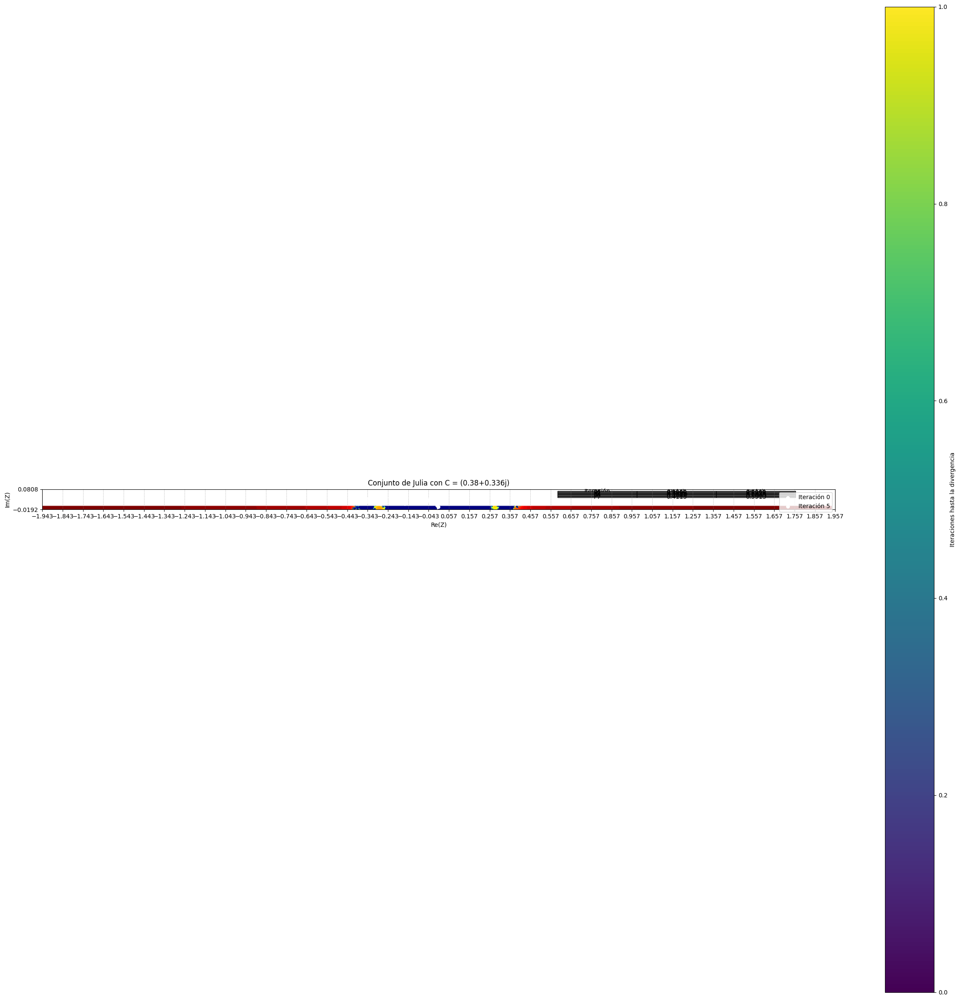

In [30]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la imagen
width, height = 1200, 1200
x_min, x_max = -1.943, 1.94
y_min, y_max = -0.01925, 0.0012
max_iter = 70  # Número máximo de iteraciones

# Definir un valor fijo para C
C_fixed = complex(0.38, 0.336)

# Crear la cuadrícula de valores complejos
x_values = np.linspace(x_min, x_max, width)
y_values = np.linspace(y_min, y_max, height)
mandelbrot_set = np.zeros((height, width))

for i, y in enumerate(y_values):
    for j, x in enumerate(x_values):
        Z = complex(x, y)  # Cada punto en la cuadrícula
        C = C_fixed  # Se usa el mismo C en todas las iteraciones
        iter_count = 0
        while abs(Z) <= 2 and iter_count < max_iter:
            Z = Z**2 + C
            iter_count += 1
        mandelbrot_set[i, j] = iter_count

# Calcular las primeras 4 iteraciones de Z_n para C_fixed
C = C_fixed
Z = complex(0, 0)  # Z0
iterations = [(Z.real, Z.imag)]  # Lista para almacenar las coordenadas de las iteraciones
for i in range(7):
    Z = Z**2 + C
    iterations.append((Z.real, Z.imag))

# Graficar el conjunto de Julia
plt.figure(figsize=(30, 30))
plt.imshow(mandelbrot_set, extent=[x_min, x_max, y_min, y_max], cmap='jet_r', origin='lower')

# Agregar las primeras 4 iteraciones como puntos rojos
for i, (x, y) in enumerate(iterations[:-1]):
    if x_min <= x <= x_max and y_min <= y <= y_max:  # Asegurar que esté dentro del área de la imagen
        plt.scatter(x, y, color='white', marker='o', s=30, label=f'Iteración {i}')
        plt.text(x, y, f'P{i} ({x:.2f}, {y:.2f})', fontsize=16, color='white', ha='right', va='bottom')

# Agregar cuadrícula y ejes cartesianos
plt.axhline(0, color='white', linewidth=1.2)  # Eje X
plt.axvline(0, color='white', linewidth=1.2)  # Eje Y
plt.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.6)  # Cuadrícula

# Establecer marcas en los ejes cada 0.1 unidades
plt.xticks(np.arange(x_min, x_max + 0.1, 0.1))
plt.yticks(np.arange(y_min, y_max + 0.1, 0.1))

# Etiquetas
plt.colorbar(label="Iteraciones hasta la divergencia")
plt.title(f"Conjunto de Julia con C = {C_fixed}")
plt.xlabel("Re(Z)")
plt.ylabel("Im(Z)")
plt.legend()

# Mostrar la gráfica
col_labels = ["Iteración", "Re(Z)", "Im(Z)"]
table_data = [(f'P{i}', f'{x:.4f}', f'{y:.4f}') for i, (x, y) in enumerate(iterations)]
table = plt.table(cellText=table_data, colLabels=col_labels, cellLoc='center', loc='upper right', bbox=[0.65, 0.6, 0.3, 0.3])
table.auto_set_font_size(False)
table.set_fontsize(10)

plt.show()

**Rango: -1.764<x<-1.7527 ; -0.01925<y<-0.0109**

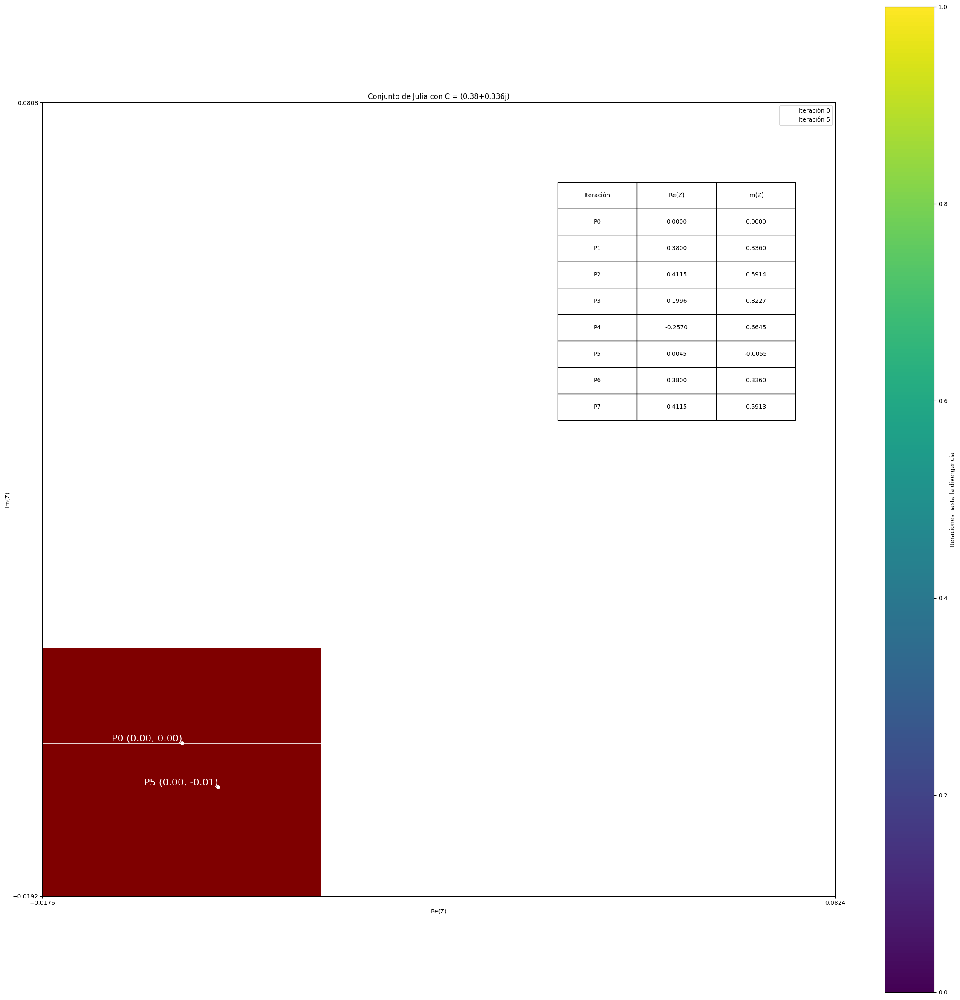

In [32]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la imagen
width, height = 1000, 1000
x_min, x_max = -0.01764, 0.017527
y_min, y_max = -0.01925, 0.012
max_iter = 100  # Número máximo de iteraciones

# Definir un valor fijo para C
C_fixed = complex(0.38, 0.336)

# Crear la cuadrícula de valores complejos
x_values = np.linspace(x_min, x_max, width)
y_values = np.linspace(y_min, y_max, height)
mandelbrot_set = np.zeros((height, width))

for i, y in enumerate(y_values):
    for j, x in enumerate(x_values):
        Z = complex(x, y)  # Cada punto en la cuadrícula
        C = C_fixed  # Se usa el mismo C en todas las iteraciones
        iter_count = 0
        while abs(Z) <= 2 and iter_count < max_iter:
            Z = Z**2 + C
            iter_count += 1
        mandelbrot_set[i, j] = iter_count

# Calcular las primeras 4 iteraciones de Z_n para C_fixed
C = C_fixed
Z = complex(0, 0)  # Z0
iterations = [(Z.real, Z.imag)]  # Lista para almacenar las coordenadas de las iteraciones
for i in range(7):
    Z = Z**2 + C
    iterations.append((Z.real, Z.imag))

# Graficar el conjunto de Julia
plt.figure(figsize=(30, 30))
plt.imshow(mandelbrot_set, extent=[x_min, x_max, y_min, y_max], cmap='jet_r', origin='lower')

# Agregar las primeras 4 iteraciones como puntos rojos
for i, (x, y) in enumerate(iterations[:-1]):
    if x_min <= x <= x_max and y_min <= y <= y_max:  # Asegurar que esté dentro del área de la imagen
        plt.scatter(x, y, color='white', marker='o', s=30, label=f'Iteración {i}')
        plt.text(x, y, f'P{i} ({x:.2f}, {y:.2f})', fontsize=16, color='white', ha='right', va='bottom')

# Agregar cuadrícula y ejes cartesianos
plt.axhline(0, color='white', linewidth=1.2)  # Eje X
plt.axvline(0, color='white', linewidth=1.2)  # Eje Y
plt.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.6)  # Cuadrícula

# Establecer marcas en los ejes cada 0.1 unidades
plt.xticks(np.arange(x_min, x_max + 0.1, 0.1))
plt.yticks(np.arange(y_min, y_max + 0.1, 0.1))

# Etiquetas
plt.colorbar(label="Iteraciones hasta la divergencia")
plt.title(f"Conjunto de Julia con C = {C_fixed}")
plt.xlabel("Re(Z)")
plt.ylabel("Im(Z)")
plt.legend()

# Mostrar la gráfica
col_labels = ["Iteración", "Re(Z)", "Im(Z)"]
table_data = [(f'P{i}', f'{x:.4f}', f'{y:.4f}') for i, (x, y) in enumerate(iterations)]
table = plt.table(cellText=table_data, colLabels=col_labels, cellLoc='center', loc='upper right', bbox=[0.65, 0.6, 0.3, 0.3])
table.auto_set_font_size(False)
table.set_fontsize(10)

plt.show()

**Rango: -1.768562608<x<-1.7685626045 ; -0.000790008<y<-0.000790005**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.widgets import RectangleSelector

# Parámetros de la imagen
width, height = 1500, 1500
x_min, x_max = -0.5, 0.5
y_min, y_max = -0.5, 0.5
max_iter = 200  # Número máximo de iteraciones

# Definir un valor fijo para C
C_fixed = complex(-0.70, -0.35)

# Crear la cuadrícula de valores complejos
x_values = np.linspace(x_min, x_max, width)
y_values = np.linspace(y_min, y_max, height)
mandelbrot_set = np.zeros((height, width))

for i, y in enumerate(y_values):
    for j, x in enumerate(x_values):
        Z = complex(x, y)  # Cada punto en la cuadrícula
        C = C_fixed  # Se usa el mismo C en todas las iteraciones
        iter_count = 0
        while abs(Z) <= 2 and iter_count < max_iter:
            Z = Z**2 + C
            iter_count += 1
        mandelbrot_set[i, j] = iter_count

# Calcular las primeras 8 iteraciones de Z_n para C_fixed
C = C_fixed
Z = complex(0, 0)  # Z0
iterations = [(Z.real, Z.imag)]  # Lista para almacenar las coordenadas de las iteraciones
for i in range(8):
    Z = Z**2 + C
    iterations.append((Z.real, Z.imag))

# Función para actualizar la vista con zoom
def update_zoom(eclick, erelease):
    global x_min, x_max, y_min, y_max
    x1, y1 = eclick.xdata, eclick.ydata
    x2, y2 = erelease.xdata, erelease.ydata
    x_min, x_max = min(x1, x2), max(x1, x2)
    y_min, y_max = min(y1, y2), max(y1, y2)
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    plt.draw()

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(40, 40))
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)

# Mostrar el conjunto de Julia
im = ax.imshow(mandelbrot_set, extent=[x_min, x_max, y_min, y_max], cmap='jet_r', origin='lower')

# Agregar las primeras 8 iteraciones como puntos blancos
for i, (x, y) in enumerate(iterations[:-1]):
    if x_min <= x <= x_max and y_min <= y <= y_max:  # Asegurar que esté dentro del área de la imagen
        ax.scatter(x, y, color='white', marker='o', s=30, label=f'Iteración {i}')
        ax.text(x, y, f'P{i} ({x:.2f}, {y:.2f})', fontsize=12, color='white', ha='right', va='bottom')

# Agregar cuadrícula y ejes cartesianos
ax.axhline(0, color='white', linewidth=1.2)  # Eje X
ax.axvline(0, color='white', linewidth=1.2)  # Eje Y
ax.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.6)  # Cuadrícula

# Establecer marcas en los ejes cada 0.1 unidades
ax.set_xticks(np.arange(x_min, x_max + 0.1, 0.1))
ax.set_yticks(np.arange(y_min, y_max + 0.1, 0.1))

# Etiquetas
plt.colorbar(im, ax=ax, label="Iteraciones hasta la divergencia")
ax.set_title(f"Conjunto de Julia con C = {C_fixed}")
ax.set_xlabel("Re(Z)")
ax.set_ylabel("Im(Z)")
ax.legend()

# Crear una tabla con las iteraciones
col_labels = ["Iteración", "Re(Z)", "Im(Z)"]
table_data = [(f'P{i}', f'{x:.4f}', f'{y:.4f}') for i, (x, y) in enumerate(iterations)]
table = ax.table(cellText=table_data, colLabels=col_labels, cellLoc='center', loc='upper right', bbox=[0.65, 0.6, 0.3, 0.3])
table.auto_set_font_size(False)
table.set_fontsize(10)

# Habilitar el zoom con el mouse
rect_selector = RectangleSelector(ax, update_zoom, useblit=True, button=[1], minspanx=5, minspany=5, spancoords='pixels', interactive=True)

# Mostrar la gráfica
plt.show()

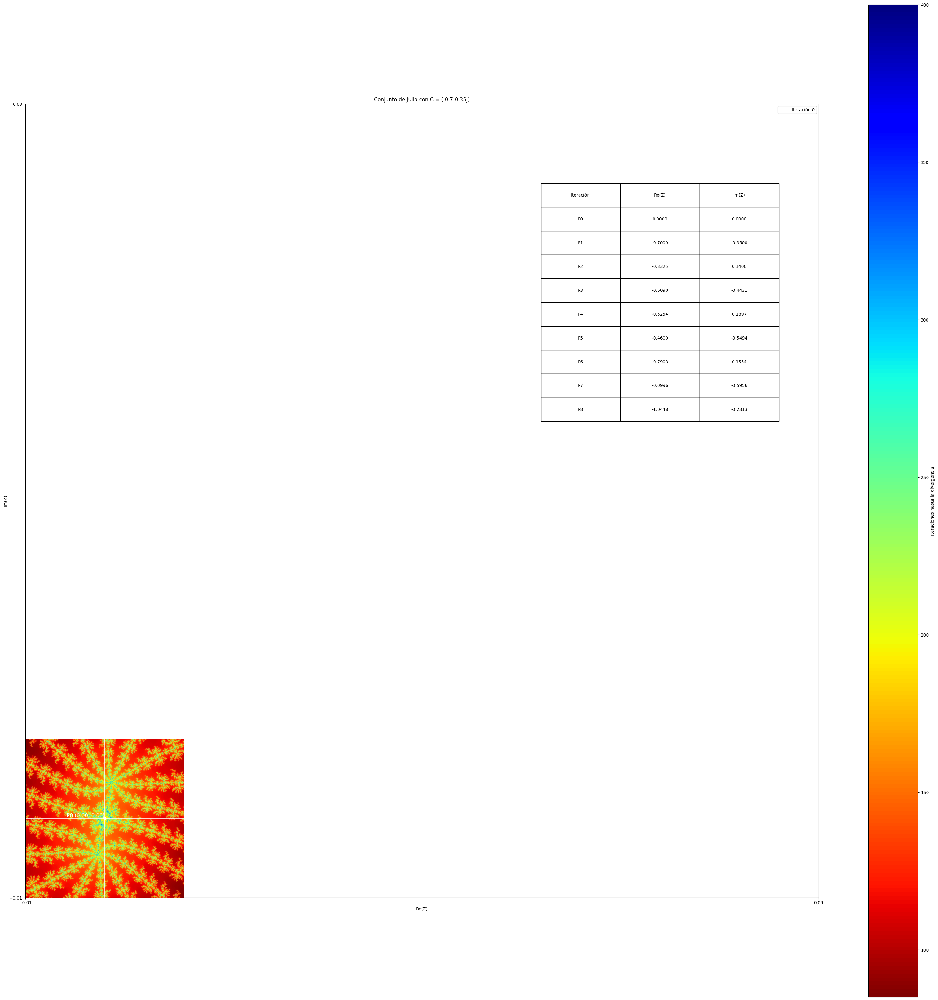

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.widgets import RectangleSelector

# Parámetros de la imagen
width, height = 1500, 1500
x_min, x_max = -0.01, 0.01
y_min, y_max = -0.01, 0.01
max_iter = 400  # Número máximo de iteraciones

# Definir un valor fijo para C
C_fixed = complex(-0.70, -0.35)

# Crear la cuadrícula de valores complejos
x_values = np.linspace(x_min, x_max, width)
y_values = np.linspace(y_min, y_max, height)
mandelbrot_set = np.zeros((height, width))

for i, y in enumerate(y_values):
    for j, x in enumerate(x_values):
        Z = complex(x, y)  # Cada punto en la cuadrícula
        C = C_fixed  # Se usa el mismo C en todas las iteraciones
        iter_count = 0
        while abs(Z) <= 2 and iter_count < max_iter:
            Z = Z**2 + C
            iter_count += 1
        mandelbrot_set[i, j] = iter_count

# Calcular las primeras 8 iteraciones de Z_n para C_fixed
C = C_fixed
Z = complex(0, 0)  # Z0
iterations = [(Z.real, Z.imag)]  # Lista para almacenar las coordenadas de las iteraciones
for i in range(8):
    Z = Z**2 + C
    iterations.append((Z.real, Z.imag))

# Función para actualizar la vista con zoom
def update_zoom(eclick, erelease):
    global x_min, x_max, y_min, y_max
    x1, y1 = eclick.xdata, eclick.ydata
    x2, y2 = erelease.xdata, erelease.ydata
    x_min, x_max = min(x1, x2), max(x1, x2)
    y_min, y_max = min(y1, y2), max(y1, y2)
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    plt.draw()

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(40, 40))
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)

# Mostrar el conjunto de Julia
im = ax.imshow(mandelbrot_set, extent=[x_min, x_max, y_min, y_max], cmap='jet_r', origin='lower')

# Agregar las primeras 8 iteraciones como puntos blancos
for i, (x, y) in enumerate(iterations[:-1]):
    if x_min <= x <= x_max and y_min <= y <= y_max:  # Asegurar que esté dentro del área de la imagen
        ax.scatter(x, y, color='white', marker='o', s=30, label=f'Iteración {i}')
        ax.text(x, y, f'P{i} ({x:.2f}, {y:.2f})', fontsize=12, color='white', ha='right', va='bottom')

# Agregar cuadrícula y ejes cartesianos
ax.axhline(0, color='white', linewidth=1.2)  # Eje X
ax.axvline(0, color='white', linewidth=1.2)  # Eje Y
ax.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.6)  # Cuadrícula

# Establecer marcas en los ejes cada 0.1 unidades
ax.set_xticks(np.arange(x_min, x_max + 0.1, 0.1))
ax.set_yticks(np.arange(y_min, y_max + 0.1, 0.1))

# Etiquetas
plt.colorbar(im, ax=ax, label="Iteraciones hasta la divergencia")
ax.set_title(f"Conjunto de Julia con C = {C_fixed}")
ax.set_xlabel("Re(Z)")
ax.set_ylabel("Im(Z)")
ax.legend()

# Crear una tabla con las iteraciones
col_labels = ["Iteración", "Re(Z)", "Im(Z)"]
table_data = [(f'P{i}', f'{x:.4f}', f'{y:.4f}') for i, (x, y) in enumerate(iterations)]
table = ax.table(cellText=table_data, colLabels=col_labels, cellLoc='center', loc='upper right', bbox=[0.65, 0.6, 0.3, 0.3])
table.auto_set_font_size(False)
table.set_fontsize(10)

# Habilitar el zoom con el mouse
rect_selector = RectangleSelector(ax, update_zoom, useblit=True, button=[1], minspanx=5, minspany=5, spancoords='pixels', interactive=True)

# Mostrar la gráfica
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.widgets import RectangleSelector

# Parámetros de la imagen
width, height = 1200, 1200
x_min, x_max = -0.1, 0.1
y_min, y_max = -0.1, 0.1
max_iter = 100  # Número máximo de iteraciones

# Definir un valor fijo para C
C_fixed = complex(-0.70, -0.35)

# Crear la cuadrícula de valores complejos
x_values = np.linspace(x_min, x_max, width)
y_values = np.linspace(y_min, y_max, height)
mandelbrot_set = np.zeros((height, width))

for i, y in enumerate(y_values):
    for j, x in enumerate(x_values):
        Z = complex(x, y)  # Cada punto en la cuadrícula
        C = C_fixed  # Se usa el mismo C en todas las iteraciones
        iter_count = 0
        while abs(Z) <= 2 and iter_count < max_iter:
            Z = Z**2 + C
            iter_count += 1
        mandelbrot_set[i, j] = iter_count

# Calcular las primeras 8 iteraciones de Z_n para C_fixed
C = C_fixed
Z = complex(0, 0)  # Z0
iterations = [(Z.real, Z.imag)]  # Lista para almacenar las coordenadas de las iteraciones
for i in range(8):
    Z = Z**2 + C
    iterations.append((Z.real, Z.imag))

# Función para actualizar la vista con zoom
def update_zoom(eclick, erelease):
    global x_min, x_max, y_min, y_max
    x1, y1 = eclick.xdata, eclick.ydata
    x2, y2 = erelease.xdata, erelease.ydata
    x_min, x_max = min(x1, x2), max(x1, x2)
    y_min, y_max = min(y1, y2), max(y1, y2)
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    plt.draw()

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(50, 50))
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)

# Mostrar el conjunto de Julia
im = ax.imshow(mandelbrot_set, extent=[x_min, x_max, y_min, y_max], cmap='jet_r', origin='lower')

# Agregar las primeras 8 iteraciones como puntos blancos
for i, (x, y) in enumerate(iterations[:-1]):
    if x_min <= x <= x_max and y_min <= y <= y_max:  # Asegurar que esté dentro del área de la imagen
        ax.scatter(x, y, color='white', marker='o', s=30, label=f'Iteración {i}')
        ax.text(x, y, f'P{i} ({x:.2f}, {y:.2f})', fontsize=12, color='white', ha='right', va='bottom')

# Agregar cuadrícula y ejes cartesianos
ax.axhline(0, color='white', linewidth=1.2)  # Eje X
ax.axvline(0, color='white', linewidth=1.2)  # Eje Y
ax.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.6)  # Cuadrícula

# Establecer marcas en los ejes cada 0.1 unidades
ax.set_xticks(np.arange(x_min, x_max + 0.1, 0.1))
ax.set_yticks(np.arange(y_min, y_max + 0.1, 0.1))

# Etiquetas
plt.colorbar(im, ax=ax, label="Iteraciones hasta la divergencia")
ax.set_title(f"Conjunto de Julia con C = {C_fixed}")
ax.set_xlabel("Re(Z)")
ax.set_ylabel("Im(Z)")
ax.legend()

# Crear una tabla con las iteraciones
col_labels = ["Iteración", "Re(Z)", "Im(Z)"]
table_data = [(f'P{i}', f'{x:.4f}', f'{y:.4f}') for i, (x, y) in enumerate(iterations)]
table = ax.table(cellText=table_data, colLabels=col_labels, cellLoc='center', loc='upper right', bbox=[0.65, 0.6, 0.3, 0.3])
table.auto_set_font_size(False)
table.set_fontsize(10)

# Habilitar el zoom con el mouse
rect_selector = RectangleSelector(ax, update_zoom, useblit=True, button=[1], minspanx=5, minspany=5, spancoords='pixels', interactive=True)

# Mostrar la gráfica
plt.show()

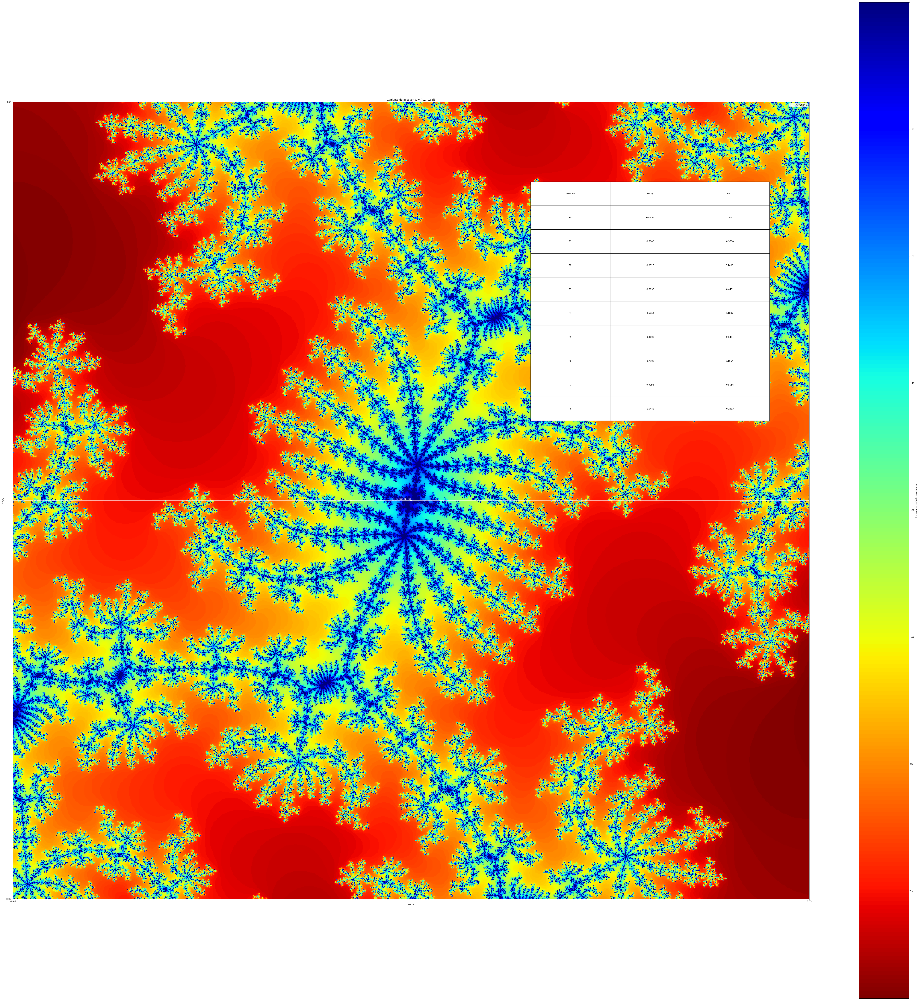

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.widgets import RectangleSelector

# Parámetros de la imagen
width, height = 1000, 1000
x_min, x_max = -0.05, 0.05
y_min, y_max = -0.05, 0.05
max_iter = 200  # Número máximo de iteraciones

# Definir un valor fijo para C
C_fixed = complex(-0.70, -0.35)

# Crear la cuadrícula de valores complejos
x_values = np.linspace(x_min, x_max, width)
y_values = np.linspace(y_min, y_max, height)
mandelbrot_set = np.zeros((height, width))

for i, y in enumerate(y_values):
    for j, x in enumerate(x_values):
        Z = complex(x, y)  # Cada punto en la cuadrícula
        C = C_fixed  # Se usa el mismo C en todas las iteraciones
        iter_count = 0
        while abs(Z) <= 2 and iter_count < max_iter:
            Z = Z**2 + C
            iter_count += 1
        mandelbrot_set[i, j] = iter_count

# Calcular las primeras 8 iteraciones de Z_n para C_fixed
C = C_fixed
Z = complex(0, 0)  # Z0
iterations = [(Z.real, Z.imag)]  # Lista para almacenar las coordenadas de las iteraciones
for i in range(8):
    Z = Z**2 + C
    iterations.append((Z.real, Z.imag))

# Función para actualizar la vista con zoom
def update_zoom(eclick, erelease):
    global x_min, x_max, y_min, y_max
    x1, y1 = eclick.xdata, eclick.ydata
    x2, y2 = erelease.xdata, erelease.ydata
    x_min, x_max = min(x1, x2), max(x1, x2)
    y_min, y_max = min(y1, y2), max(y1, y2)
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    plt.draw()

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(80, 80))
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)

# Mostrar el conjunto de Julia
im = ax.imshow(mandelbrot_set, extent=[x_min, x_max, y_min, y_max], cmap='jet_r', origin='lower')

# Agregar las primeras 8 iteraciones como puntos blancos
for i, (x, y) in enumerate(iterations[:-1]):
    if x_min <= x <= x_max and y_min <= y <= y_max:  # Asegurar que esté dentro del área de la imagen
        ax.scatter(x, y, color='white', marker='o', s=30, label=f'Iteración {i}')
        ax.text(x, y, f'P{i} ({x:.2f}, {y:.2f})', fontsize=12, color='white', ha='right', va='bottom')

# Agregar cuadrícula y ejes cartesianos
ax.axhline(0, color='white', linewidth=1.2)  # Eje X
ax.axvline(0, color='white', linewidth=1.2)  # Eje Y
ax.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.6)  # Cuadrícula

# Establecer marcas en los ejes cada 0.1 unidades
ax.set_xticks(np.arange(x_min, x_max + 0.1, 0.1))
ax.set_yticks(np.arange(y_min, y_max + 0.1, 0.1))

# Etiquetas
plt.colorbar(im, ax=ax, label="Iteraciones hasta la divergencia")
ax.set_title(f"Conjunto de Julia con C = {C_fixed}")
ax.set_xlabel("Re(Z)")
ax.set_ylabel("Im(Z)")
ax.legend()

# Crear una tabla con las iteraciones
col_labels = ["Iteración", "Re(Z)", "Im(Z)"]
table_data = [(f'P{i}', f'{x:.4f}', f'{y:.4f}') for i, (x, y) in enumerate(iterations)]
table = ax.table(cellText=table_data, colLabels=col_labels, cellLoc='center', loc='upper right', bbox=[0.65, 0.6, 0.3, 0.3])
table.auto_set_font_size(False)
table.set_fontsize(10)

# Habilitar el zoom con el mouse
rect_selector = RectangleSelector(ax, update_zoom, useblit=True, button=[1], minspanx=5, minspany=5, spancoords='pixels', interactive=True)

# Mostrar la gráfica
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.widgets import RectangleSelector

# Parámetros de la imagen
width, height = 1000, 1000
x_min, x_max = -0.05, 0.05
y_min, y_max = -0.05, 0.05
max_iter = 200  # Número máximo de iteraciones

# Definir un valor fijo para C
C_fixed = complex(-0.70, -0.35)

# Crear la cuadrícula de valores complejos
x_values = np.linspace(x_min, x_max, width)
y_values = np.linspace(y_min, y_max, height)
mandelbrot_set = np.zeros((height, width))

for i, y in enumerate(y_values):
    for j, x in enumerate(x_values):
        Z = complex(x, y)  # Cada punto en la cuadrícula
        C = C_fixed  # Se usa el mismo C en todas las iteraciones
        iter_count = 0
        while abs(Z) <= 2 and iter_count < max_iter:
            Z = Z**2 + C
            iter_count += 1
        mandelbrot_set[i, j] = iter_count

# Calcular las primeras 8 iteraciones de Z_n para C_fixed
C = C_fixed
Z = complex(0, 0)  # Z0
iterations = [(Z.real, Z.imag)]  # Lista para almacenar las coordenadas de las iteraciones
for i in range(8):
    Z = Z**2 + C
    iterations.append((Z.real, Z.imag))

# Función para actualizar la vista con zoom
def update_zoom(eclick, erelease):
    global x_min, x_max, y_min, y_max
    x1, y1 = eclick.xdata, eclick.ydata
    x2, y2 = erelease.xdata, erelease.ydata
    x_min, x_max = min(x1, x2), max(x1, x2)
    y_min, y_max = min(y1, y2), max(y1, y2)
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    plt.draw()

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(180, 180))
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)

# Mostrar el conjunto de Julia
im = ax.imshow(mandelbrot_set, extent=[x_min, x_max, y_min, y_max], cmap='jet_r', origin='lower')

# Agregar las primeras 8 iteraciones como puntos blancos
for i, (x, y) in enumerate(iterations[:-1]):
    if x_min <= x <= x_max and y_min <= y <= y_max:  # Asegurar que esté dentro del área de la imagen
        ax.scatter(x, y, color='white', marker='o', s=30, label=f'Iteración {i}')
        ax.text(x, y, f'P{i} ({x:.2f}, {y:.2f})', fontsize=12, color='white', ha='right', va='bottom')

# Agregar cuadrícula y ejes cartesianos
ax.axhline(0, color='white', linewidth=1.2)  # Eje X
ax.axvline(0, color='white', linewidth=1.2)  # Eje Y
ax.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.6)  # Cuadrícula

# Establecer marcas en los ejes cada 0.1 unidades
ax.set_xticks(np.arange(x_min, x_max + 0.1, 0.1))
ax.set_yticks(np.arange(y_min, y_max + 0.1, 0.1))

# Etiquetas
plt.colorbar(im, ax=ax, label="Iteraciones hasta la divergencia")
ax.set_title(f"Conjunto de Julia con C = {C_fixed}")
ax.set_xlabel("Re(Z)")
ax.set_ylabel("Im(Z)")
ax.legend()

# Crear una tabla con las iteraciones
col_labels = ["Iteración", "Re(Z)", "Im(Z)"]
table_data = [(f'P{i}', f'{x:.4f}', f'{y:.4f}') for i, (x, y) in enumerate(iterations)]
table = ax.table(cellText=table_data, colLabels=col_labels, cellLoc='center', loc='upper right', bbox=[0.65, 0.6, 0.3, 0.3])
table.auto_set_font_size(False)
table.set_fontsize(10)

# Habilitar el zoom con el mouse
rect_selector = RectangleSelector(ax, update_zoom, useblit=True, button=[1], minspanx=5, minspany=5, spancoords='pixels', interactive=True)

# Mostrar la gráfica
plt.show()

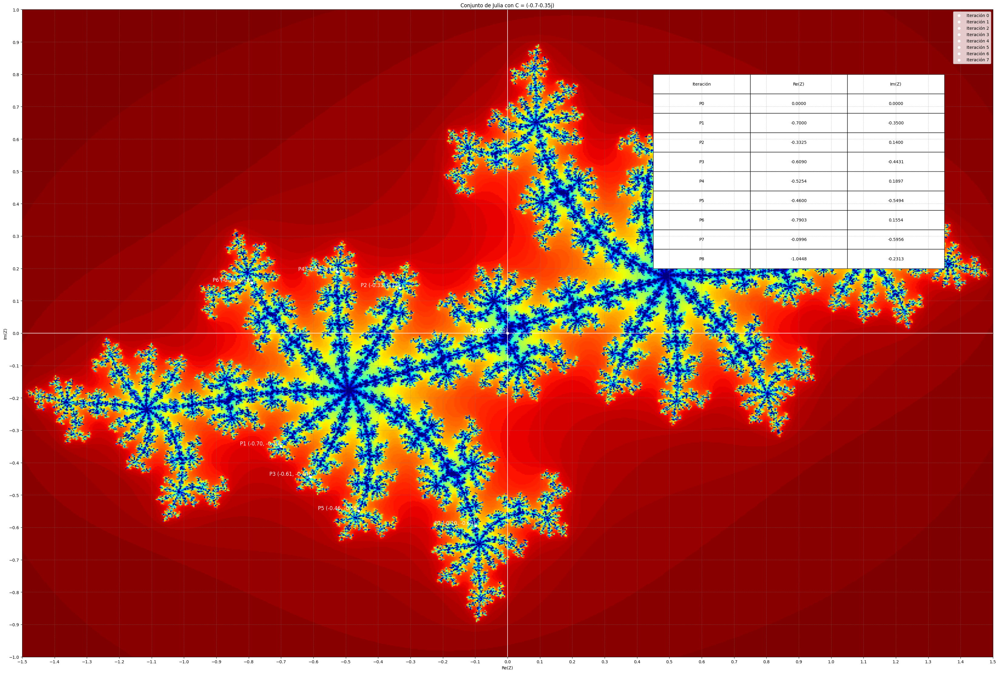

In [8]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros iniciales de la imagen
width, height = 800, 800
x_min, x_max = -1.5, 1.5
y_min, y_max = -1, 1
max_iter = 100  # Número máximo de iteraciones

# Definir un valor fijo para C
C_fixed = complex(-0.70, -0.35)

# Función para calcular el conjunto de Julia
def compute_julia_set(x_min, x_max, y_min, y_max, width, height, max_iter, C_fixed):
    x_values = np.linspace(x_min, x_max, width)
    y_values = np.linspace(y_min, y_max, height)
    julia_set = np.zeros((height, width))

    for i, y in enumerate(y_values):
        for j, x in enumerate(x_values):
            Z = complex(x, y)  # Cada punto en la cuadrícula
            C = C_fixed  # Se usa el mismo C en todas las iteraciones
            iter_count = 0
            while abs(Z) <= 2 and iter_count < max_iter:
                Z = Z**2 + C
                iter_count += 1
            julia_set[i, j] = iter_count

    return julia_set

# Función para redibujar la imagen con nuevos límites
def redraw_julia_set(x_min, x_max, y_min, y_max):
    ax.clear()  # Limpiar el eje actual
    julia_set = compute_julia_set(x_min, x_max, y_min, y_max, width, height, max_iter, C_fixed)
    ax.imshow(julia_set, extent=[x_min, x_max, y_min, y_max], cmap='jet_r', origin='lower')

    # Agregar las primeras 8 iteraciones como puntos blancos
    for i, (x, y) in enumerate(iterations[:-1]):
        if x_min <= x <= x_max and y_min <= y <= y_max:  # Asegurar que esté dentro del área de la imagen
            ax.scatter(x, y, color='white', marker='o', s=30, label=f'Iteración {i}')
            ax.text(x, y, f'P{i} ({x:.2f}, {y:.2f})', fontsize=12, color='white', ha='right', va='bottom')

    # Agregar cuadrícula y ejes cartesianos
    ax.axhline(0, color='white', linewidth=1.2)  # Eje X
    ax.axvline(0, color='white', linewidth=1.2)  # Eje Y
    ax.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.6)  # Cuadrícula

    # Establecer marcas en los ejes cada 0.1 unidades
    ax.set_xticks(np.arange(x_min, x_max + 0.1, 0.1))
    ax.set_yticks(np.arange(y_min, y_max + 0.1, 0.1))

    # Etiquetas
    ax.set_title(f"Conjunto de Julia con C = {C_fixed}")
    ax.set_xlabel("Re(Z)")
    ax.set_ylabel("Im(Z)")
    ax.legend()

    # Crear una tabla con las iteraciones
    col_labels = ["Iteración", "Re(Z)", "Im(Z)"]
    table_data = [(f'P{i}', f'{x:.4f}', f'{y:.4f}') for i, (x, y) in enumerate(iterations)]
    table = ax.table(cellText=table_data, colLabels=col_labels, cellLoc='center', loc='upper right', bbox=[0.65, 0.6, 0.3, 0.3])
    table.auto_set_font_size(False)
    table.set_fontsize(10)

    plt.draw()  # Redibujar la figura

# Función para manejar el evento de zoom con el mouse
def on_press(event):
    global x_min, x_max, y_min, y_max
    if event.button == 1:  # Botón izquierdo del ratón
        x_center, y_center = event.xdata, event.ydata
        if x_center is not None and y_center is not None:
            # Calcular nuevos límites para hacer zoom
            zoom_factor = 0.5  # Factor de zoom (ajustable)
            x_range = (x_max - x_min) * zoom_factor
            y_range = (y_max - y_min) * zoom_factor
            x_min, x_max = x_center - x_range / 2, x_center + x_range / 2
            y_min, y_max = y_center - y_range / 2, y_center + y_range / 2
            redraw_julia_set(x_min, x_max, y_min, y_max)

# Calcular las primeras 8 iteraciones de Z_n para C_fixed
C = C_fixed
Z = complex(0, 0)  # Z0
iterations = [(Z.real, Z.imag)]  # Lista para almacenar las coordenadas de las iteraciones
for i in range(8):
    Z = Z**2 + C
    iterations.append((Z.real, Z.imag))

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(40, 40))
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)

# Dibujar el conjunto de Julia inicial
redraw_julia_set(x_min, x_max, y_min, y_max)

# Conectar el evento de clic del ratón
fig.canvas.mpl_connect('button_press_event', on_press)

# Mostrar la gráfica
plt.show()

**Codigo con zoom y etiquetas**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros iniciales de la imagen
width, height = 800, 800
x_min, x_max = -1.5, 1.5
y_min, y_max = -1, 1
max_iter = 150  # Número máximo de iteraciones

# Definir un valor fijo para C
C_fixed = complex(-0.70, -0.35)

# Función para calcular el conjunto de Julia
def compute_julia_set(x_min, x_max, y_min, y_max, width, height, max_iter, C_fixed):
    x_values = np.linspace(x_min, x_max, width)
    y_values = np.linspace(y_min, y_max, height)
    julia_set = np.zeros((height, width))

    for i, y in enumerate(y_values):
        for j, x in enumerate(x_values):
            Z = complex(x, y)  # Cada punto en la cuadrícula
            C = C_fixed  # Se usa el mismo C en todas las iteraciones
            iter_count = 0
            while abs(Z) <= 2 and iter_count < max_iter:
                Z = Z**2 + C
                iter_count += 1
            julia_set[i, j] = iter_count

    return julia_set

# Función para redibujar la imagen con nuevos límites
def redraw_julia_set(x_min, x_max, y_min, y_max):
    # Calcular el nuevo conjunto de Julia
    julia_set = compute_julia_set(x_min, x_max, y_min, y_max, width, height, max_iter, C_fixed)

    # Actualizar la imagen
    im.set_data(julia_set)
    im.set_extent([x_min, x_max, y_min, y_max])

    # Actualizar los límites de los ejes
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)

    # Redibujar las iteraciones
    for scatter in ax.collections:
        scatter.remove()  # Eliminar los puntos anteriores
    for text in ax.texts:
        text.remove()  # Eliminar los textos anteriores

    # Agregar las primeras 8 iteraciones como puntos blancos
    for i, (x, y) in enumerate(iterations[:-1]):
        if x_min <= x <= x_max and y_min <= y <= y_max:  # Asegurar que esté dentro del área de la imagen
            ax.scatter(x, y, color='white', marker='o', s=30, label=f'Iteración {i}')
            ax.text(x, y, f'P{i} ({x:.2f}, {y:.2f})', fontsize=12, color='white', ha='right', va='bottom')

    # Redibujar la figura
    plt.draw()

# Función para manejar el evento de zoom con el mouse
def on_press(event):
    global x_min, x_max, y_min, y_max
    if event.button == 1:  # Botón izquierdo del ratón (zoom hacia adentro)
        x_center, y_center = event.xdata, event.ydata
        if x_center is not None and y_center is not None:
            # Calcular nuevos límites para hacer zoom hacia adentro
            zoom_factor = 0.5  # Factor de zoom (ajustable)
            x_range = (x_max - x_min) * zoom_factor
            y_range = (y_max - y_min) * zoom_factor
            x_min, x_max = x_center - x_range / 2, x_center + x_range / 2
            y_min, y_max = y_center - y_range / 2, y_center + y_range / 2
            redraw_julia_set(x_min, x_max, y_min, y_max)

    elif event.button == 3:  # Botón derecho del ratón (zoom hacia afuera)
        x_center, y_center = event.xdata, event.ydata
        if x_center is not None and y_center is not None:
            # Calcular nuevos límites para hacer zoom hacia afuera
            zoom_factor = 2.0  # Factor de zoom (ajustable)
            x_range = (x_max - x_min) * zoom_factor
            y_range = (y_max - y_min) * zoom_factor
            x_min, x_max = x_center - x_range / 2, x_center + x_range / 2
            y_min, y_max = y_center - y_range / 2, y_center + y_range / 2
            redraw_julia_set(x_min, x_max, y_min, y_max)

# Calcular las primeras 8 iteraciones de Z_n para C_fixed
C = C_fixed
Z = complex(0, 0)  # Z0
iterations = [(Z.real, Z.imag)]  # Lista para almacenar las coordenadas de las iteraciones
for i in range(8):
    Z = Z**2 + C
    iterations.append((Z.real, Z.imag))

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(40, 40))  # Tamaño constante de la figura
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)

# Dibujar el conjunto de Julia inicial
julia_set = compute_julia_set(x_min, x_max, y_min, y_max, width, height, max_iter, C_fixed)
im = ax.imshow(julia_set, extent=[x_min, x_max, y_min, y_max], cmap='jet_r', origin='lower')

# Agregar las primeras 8 iteraciones como puntos blancos
for i, (x, y) in enumerate(iterations[:-1]):
    if x_min <= x <= x_max and y_min <= y <= y_max:  # Asegurar que esté dentro del área de la imagen
        ax.scatter(x, y, color='white', marker='o', s=30, label=f'Iteración {i}')
        ax.text(x, y, f'P{i} ({x:.2f}, {y:.2f})', fontsize=12, color='white', ha='right', va='bottom')

# Agregar cuadrícula y ejes cartesianos
ax.axhline(0, color='white', linewidth=1.2)  # Eje X
ax.axvline(0, color='white', linewidth=1.2)  # Eje Y
ax.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.6)  # Cuadrícula

# Establecer marcas en los ejes cada 0.1 unidades
ax.set_xticks(np.arange(x_min, x_max + 0.1, 0.1))
ax.set_yticks(np.arange(y_min, y_max + 0.1, 0.1))

# Etiquetas
ax.set_title(f"Conjunto de Julia con C = {C_fixed}")
ax.set_xlabel("Re(Z)")
ax.set_ylabel("Im(Z)")
ax.legend()

# Crear una tabla con las iteraciones
col_labels = ["Iteración", "Re(Z)", "Im(Z)"]
table_data = [(f'P{i}', f'{x:.4f}', f'{y:.4f}') for i, (x, y) in enumerate(iterations)]
table = ax.table(cellText=table_data, colLabels=col_labels, cellLoc='center', loc='upper right', bbox=[0.65, 0.6, 0.3, 0.3])
table.auto_set_font_size(False)
table.set_fontsize(10)

# Conectar el evento de clic del ratón
fig.canvas.mpl_connect('button_press_event', on_press)

# Mostrar la gráfica
plt.show()

**Codigo sin etiquetas y cuadricula**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros iniciales de la imagen
width, height = 800, 800
x_min, x_max = -1.5, 1.5
y_min, y_max = -1, 1
max_iter = 150  # Número máximo de iteraciones

# Definir un valor fijo para C
C_fixed = complex(-0.70, -0.35)

# Función para calcular el conjunto de Julia
def compute_julia_set(x_min, x_max, y_min, y_max, width, height, max_iter, C_fixed):
    x_values = np.linspace(x_min, x_max, width)
    y_values = np.linspace(y_min, y_max, height)
    julia_set = np.zeros((height, width))

    for i, y in enumerate(y_values):
        for j, x in enumerate(x_values):
            Z = complex(x, y)  # Cada punto en la cuadrícula
            C = C_fixed  # Se usa el mismo C en todas las iteraciones
            iter_count = 0
            while abs(Z) <= 2 and iter_count < max_iter:
                Z = Z**2 + C
                iter_count += 1
            julia_set[i, j] = iter_count

    return julia_set

# Función para redibujar la imagen con nuevos límites
def redraw_julia_set(x_min, x_max, y_min, y_max):
    # Calcular el nuevo conjunto de Julia
    julia_set = compute_julia_set(x_min, x_max, y_min, y_max, width, height, max_iter, C_fixed)

    # Actualizar la imagen
    im.set_data(julia_set)
    im.set_extent([x_min, x_max, y_min, y_max])

    # Actualizar los límites de los ejes
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)

    # Redibujar las iteraciones
    for scatter in ax.collections:
        scatter.remove()  # Eliminar los puntos anteriores
    for text in ax.texts:
        text.remove()  # Eliminar los textos anteriores

    # Agregar las primeras 8 iteraciones como puntos blancos
    for i, (x, y) in enumerate(iterations[:-1]):
        if x_min <= x <= x_max and y_min <= y <= y_max:  # Asegurar que esté dentro del área de la imagen
            ax.scatter(x, y, color='white', marker='o', s=30, label=f'Iteración {i}')
            ax.text(x, y, f'P{i} ({x:.2f}, {y:.2f})', fontsize=12, color='white', ha='right', va='bottom')

    # Redibujar la figura
    plt.draw()

# Función para manejar el evento de zoom con el mouse
def on_press(event):
    global x_min, x_max, y_min, y_max
    if event.button == 1:  # Botón izquierdo del ratón (zoom hacia adentro)
        x_center, y_center = event.xdata, event.ydata
        if x_center is not None and y_center is not None:
            # Calcular nuevos límites para hacer zoom hacia adentro
            zoom_factor = 0.5  # Factor de zoom (ajustable)
            x_range = (x_max - x_min) * zoom_factor
            y_range = (y_max - y_min) * zoom_factor
            x_min, x_max = x_center - x_range / 2, x_center + x_range / 2
            y_min, y_max = y_center - y_range / 2, y_center + y_range / 2
            redraw_julia_set(x_min, x_max, y_min, y_max)

    elif event.button == 3:  # Botón derecho del ratón (zoom hacia afuera)
        x_center, y_center = event.xdata, event.ydata
        if x_center is not None and y_center is not None:
            # Calcular nuevos límites para hacer zoom hacia afuera
            zoom_factor = 2.0  # Factor de zoom (ajustable)
            x_range = (x_max - x_min) * zoom_factor
            y_range = (y_max - y_min) * zoom_factor
            x_min, x_max = x_center - x_range / 2, x_center + x_range / 2
            y_min, y_max = y_center - y_range / 2, y_center + y_range / 2
            redraw_julia_set(x_min, x_max, y_min, y_max)

# Calcular las primeras 8 iteraciones de Z_n para C_fixed
C = C_fixed
Z = complex(0, 0)  # Z0
iterations = [(Z.real, Z.imag)]  # Lista para almacenar las coordenadas de las iteraciones
for i in range(8):
    Z = Z**2 + C
    iterations.append((Z.real, Z.imag))

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(60, 60))  # Tamaño constante de la figura
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)

# Dibujar el conjunto de Julia inicial
julia_set = compute_julia_set(x_min, x_max, y_min, y_max, width, height, max_iter, C_fixed)
im = ax.imshow(julia_set, extent=[x_min, x_max, y_min, y_max], cmap='jet_r', origin='lower')

# Eliminado los puntos

# Agregar cuadrícula y ejes cartesianos
ax.axhline(0, color='white', linewidth=1.2)  # Eje X
ax.axvline(0, color='white', linewidth=1.2)  # Eje Y
#Elimanada cuadricula

# Etiquetas
ax.set_title(f"Conjunto de Julia con C = {C_fixed}")
ax.set_xlabel("Re(Z)")
ax.set_ylabel("Im(Z)")
ax.legend()

# Eliminada una tabla con las iteraciones


# Conectar el evento de clic del ratón
fig.canvas.mpl_connect('button_press_event', on_press)

# Mostrar la gráfica
plt.show()

**Ventana que llega a otra**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.widgets import Button

# Parámetros iniciales de la imagen
width, height = 800, 800
x_min, x_max = -1.5, 1.5
y_min, y_max = -1, 1
max_iter = 150  # Número máximo de iteraciones

# Definir un valor fijo para C
C_fixed = complex(-0.70, -0.35)

# Función para calcular el conjunto de Julia
def compute_julia_set(x_min, x_max, y_min, y_max, width, height, max_iter, C_fixed):
    x_values = np.linspace(x_min, x_max, width)
    y_values = np.linspace(y_min, y_max, height)
    julia_set = np.zeros((height, width))

    for i, y in enumerate(y_values):
        for j, x in enumerate(x_values):
            Z = complex(x, y)  # Cada punto en la cuadrícula
            C = C_fixed  # Se usa el mismo C en todas las iteraciones
            iter_count = 0
            while abs(Z) <= 2 and iter_count < max_iter:
                Z = Z**2 + C
                iter_count += 1
            julia_set[i, j] = iter_count

    return julia_set

# Función para redibujar la imagen con nuevos límites
def redraw_julia_set(x_min, x_max, y_min, y_max):
    # Calcular el nuevo conjunto de Julia
    julia_set = compute_julia_set(x_min, x_max, y_min, y_max, width, height, max_iter, C_fixed)

    # Actualizar la imagen
    im.set_data(julia_set)
    im.set_extent([x_min, x_max, y_min, y_max])

    # Actualizar los límites de los ejes
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)

    # Redibujar las iteraciones
    for scatter in ax.collections:
        scatter.remove()  # Eliminar los puntos anteriores
    for text in ax.texts:
        text.remove()  # Eliminar los textos anteriores

    # Agregar las primeras 8 iteraciones como puntos blancos
    for i, (x, y) in enumerate(iterations[:-1]):
        if x_min <= x <= x_max and y_min <= y <= y_max:  # Asegurar que esté dentro del área de la imagen
            ax.scatter(x, y, color='white', marker='o', s=30, label=f'Iteración {i}')
            ax.text(x, y, f'P{i} ({x:.2f}, {y:.2f})', fontsize=12, color='white', ha='right', va='bottom')

    # Redibujar la figura
    plt.draw()

# Función para manejar el evento de zoom con el mouse
def on_press(event):
    global x_min, x_max, y_min, y_max
    if event.button == 1:  # Botón izquierdo del ratón (zoom hacia adentro)
        x_center, y_center = event.xdata, event.ydata
        if x_center is not None and y_center is not None:
            # Calcular nuevos límites para hacer zoom hacia adentro
            zoom_factor = 0.5  # Factor de zoom (ajustable)
            x_range = (x_max - x_min) * zoom_factor
            y_range = (y_max - y_min) * zoom_factor
            x_min, x_max = x_center - x_range / 2, x_center + x_range / 2
            y_min, y_max = y_center - y_range / 2, y_center + y_range / 2
            redraw_julia_set(x_min, x_max, y_min, y_max)

    elif event.button == 3:  # Botón derecho del ratón (zoom hacia afuera)
        x_center, y_center = event.xdata, event.ydata
        if x_center is not None and y_center is not None:
            # Calcular nuevos límites para hacer zoom hacia afuera
            zoom_factor = 2.0  # Factor de zoom (ajustable)
            x_range = (x_max - x_min) * zoom_factor
            y_range = (y_max - y_min) * zoom_factor
            x_min, x_max = x_center - x_range / 2, x_center + x_range / 2
            y_min, y_max = y_center - y_range / 2, y_center + y_range / 2
            redraw_julia_set(x_min, x_max, y_min, y_max)

# Función para abrir la segunda ventana
def open_second_code(event):
    plt.close()  # Cierra la ventana actual
    ejecutar_segundo_codigo()  # Ejecuta el segundo código

# Función que contiene el segundo código
def ejecutar_segundo_codigo():
    import numpy as np
    import matplotlib.pyplot as plt

    # Parámetros iniciales de la imagen
    width, height = 800, 800
    x_min, x_max = -1.5, 1.5
    y_min, y_max = -1, 1
    max_iter = 150  # Número máximo de iteraciones

    # Definir un valor fijo para C
    C_fixed = complex(-0.70, -0.35)

    # Función para calcular el conjunto de Julia
    def compute_julia_set(x_min, x_max, y_min, y_max, width, height, max_iter, C_fixed):
        x_values = np.linspace(x_min, x_max, width)
        y_values = np.linspace(y_min, y_max, height)
        julia_set = np.zeros((height, width))

        for i, y in enumerate(y_values):
            for j, x in enumerate(x_values):
                Z = complex(x, y)  # Cada punto en la cuadrícula
                C = C_fixed  # Se usa el mismo C en todas las iteraciones
                iter_count = 0
                while abs(Z) <= 2 and iter_count < max_iter:
                    Z = Z**2 + C
                    iter_count += 1
                julia_set[i, j] = iter_count

        return julia_set

    # Función para redibujar la imagen con nuevos límites
    def redraw_julia_set(x_min, x_max, y_min, y_max):
        # Calcular el nuevo conjunto de Julia
        julia_set = compute_julia_set(x_min, x_max, y_min, y_max, width, height, max_iter, C_fixed)

        # Actualizar la imagen
        im.set_data(julia_set)
        im.set_extent([x_min, x_max, y_min, y_max])

        # Actualizar los límites de los ejes
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)

        # Redibujar la figura
        plt.draw()

    # Función para manejar el evento de zoom con el mouse
    def on_press(event):
        global x_min, x_max, y_min, y_max
        if event.button == 1:  # Botón izquierdo del ratón (zoom hacia adentro)
            x_center, y_center = event.xdata, event.ydata
            if x_center is not None and y_center is not None:
                # Calcular nuevos límites para hacer zoom hacia adentro
                zoom_factor = 0.5  # Factor de zoom (ajustable)
                x_range = (x_max - x_min) * zoom_factor
                y_range = (y_max - y_min) * zoom_factor
                x_min, x_max = x_center - x_range / 2, x_center + x_range / 2
                y_min, y_max = y_center - y_range / 2, y_center + y_range / 2
                redraw_julia_set(x_min, x_max, y_min, y_max)

        elif event.button == 3:  # Botón derecho del ratón (zoom hacia afuera)
            x_center, y_center = event.xdata, event.ydata
            if x_center is not None and y_center is not None:
                # Calcular nuevos límites para hacer zoom hacia afuera
                zoom_factor = 2.0  # Factor de zoom (ajustable)
                x_range = (x_max - x_min) * zoom_factor
                y_range = (y_max - y_min) * zoom_factor
                x_min, x_max = x_center - x_range / 2, x_center + x_range / 2
                y_min, y_max = y_center - y_range / 2, y_center + y_range / 2
                redraw_julia_set(x_min, x_max, y_min, y_max)

    # Crear la figura y los ejes
    fig, ax = plt.subplots(figsize=(60, 60))  # Tamaño constante de la figura
    plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)

    # Dibujar el conjunto de Julia inicial
    julia_set = compute_julia_set(x_min, x_max, y_min, y_max, width, height, max_iter, C_fixed)
    im = ax.imshow(julia_set, extent=[x_min, x_max, y_min, y_max], cmap='jet_r', origin='lower')

    # Agregar cuadrícula y ejes cartesianos
    ax.axhline(0, color='white', linewidth=1.2)  # Eje X
    ax.axvline(0, color='white', linewidth=1.2)  # Eje Y

    # Etiquetas
    ax.set_title(f"Conjunto de Julia con C = {C_fixed} (Sin Puntos)")
    ax.set_xlabel("Re(Z)")
    ax.set_ylabel("Im(Z)")

    # Conectar el evento de clic del ratón
    fig.canvas.mpl_connect('button_press_event', on_press)

    # Mostrar la gráfica
    plt.show()

# Calcular las primeras 8 iteraciones de Z_n para C_fixed
C = C_fixed
Z = complex(0, 0)  # Z0
iterations = [(Z.real, Z.imag)]  # Lista para almacenar las coordenadas de las iteraciones
for i in range(8):
    Z = Z**2 + C
    iterations.append((Z.real, Z.imag))

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(40, 40))  # Tamaño constante de la figura
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)

# Dibujar el conjunto de Julia inicial
julia_set = compute_julia_set(x_min, x_max, y_min, y_max, width, height, max_iter, C_fixed)
im = ax.imshow(julia_set, extent=[x_min, x_max, y_min, y_max], cmap='jet_r', origin='lower')

# Agregar las primeras 8 iteraciones como puntos blancos
for i, (x, y) in enumerate(iterations[:-1]):
    if x_min <= x <= x_max and y_min <= y <= y_max:  # Asegurar que esté dentro del área de la imagen
        ax.scatter(x, y, color='white', marker='o', s=30, label=f'Iteración {i}')
        ax.text(x, y, f'P{i} ({x:.2f}, {y:.2f})', fontsize=12, color='white', ha='right', va='bottom')

# Agregar cuadrícula y ejes cartesianos
ax.axhline(0, color='white', linewidth=1.2)  # Eje X
ax.axvline(0, color='white', linewidth=1.2)  # Eje Y
ax.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.6)  # Cuadrícula

# Establecer marcas en los ejes cada 0.1 unidades
ax.set_xticks(np.arange(x_min, x_max + 0.1, 0.1))
ax.set_yticks(np.arange(y_min, y_max + 0.1, 0.1))

# Etiquetas
ax.set_title(f"Conjunto de Julia con C = {C_fixed} (Con Puntos)")
ax.set_xlabel("Re(Z)")
ax.set_ylabel("Im(Z)")
ax.legend()

# Crear una tabla con las iteraciones
col_labels = ["Iteración", "Re(Z)", "Im(Z)"]
table_data = [(f'P{i}', f'{x:.4f}', f'{y:.4f}') for i, (x, y) in enumerate(iterations)]
table = ax.table(cellText=table_data, colLabels=col_labels, cellLoc='center', loc='upper right', bbox=[0.65, 0.6, 0.3, 0.3])
table.auto_set_font_size(False)
table.set_fontsize(10)

# Conectar el evento de clic del ratón
fig.canvas.mpl_connect('button_press_event', on_press)

# Crear un botón para abrir la segunda ventana
ax_button = plt.axes([0.8, 0.05, 0.1, 0.075])
btn = Button(ax_button, 'Abrir 2do Código')
btn.on_clicked(open_second_code)

# Mostrar la gráfica
plt.show()

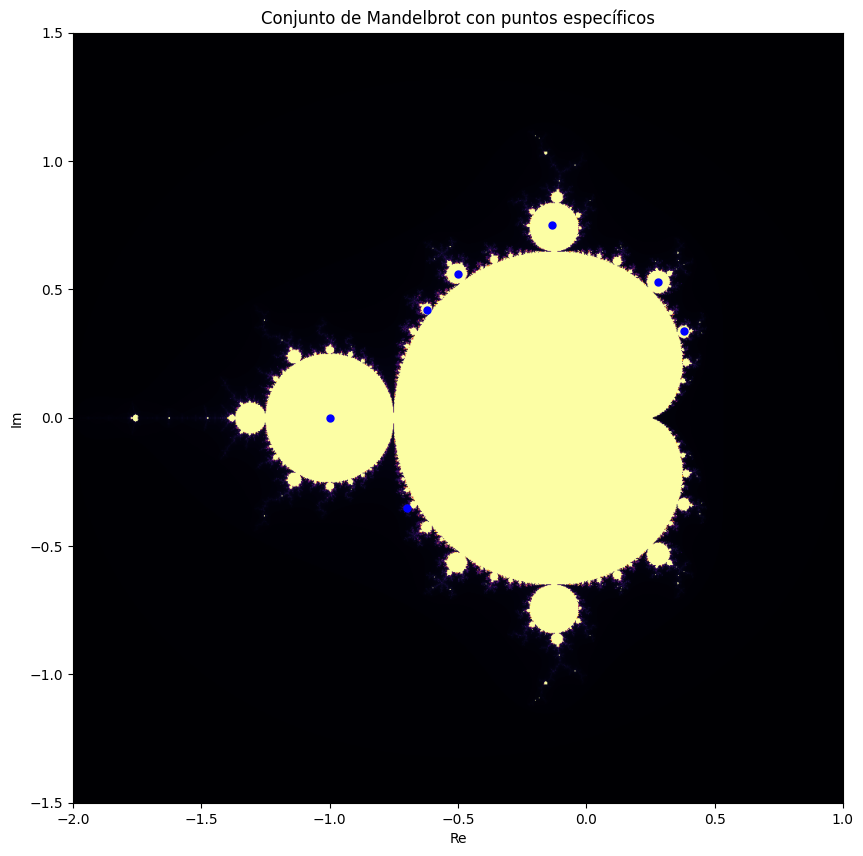

In [1]:
import numpy as np
import matplotlib.pyplot as plt

def mandelbrot(c, max_iter=100):
    z = 0
    for n in range(max_iter):
        if abs(z) > 2:
            return n
        z = z*z + c
    return max_iter

def mandelbrot_set(xmin, xmax, ymin, ymax, width, height, max_iter):
    x = np.linspace(xmin, xmax, width)
    y = np.linspace(ymin, ymax, height)
    result = np.zeros((height, width))
    
    for i in range(height):
        for j in range(width):
            result[i, j] = mandelbrot(complex(x[j], y[i]), max_iter)
    
    return result

# Parámetros del gráfico
xmin, xmax, ymin, ymax = -2, 1, -1.5, 1.5
width, height = 1000, 1000
max_iter = 500

# Generar el conjunto de Mandelbrot
mandelbrot_img = mandelbrot_set(xmin, xmax, ymin, ymax, width, height, max_iter)

# Puntos especificados
points = [(-1, 0), (-0.1342, 0.7516), (0.28, 0.53), (-0.5, 0.56), 
          (0.38, 0.336), (-0.62, 0.42), (-0.70, -0.35)]

# Graficar el resultado
plt.figure(figsize=(10, 10))
plt.imshow(mandelbrot_img, extent=(xmin, xmax, ymin, ymax), cmap='inferno', origin='lower')

# Marcar los puntos
for px, py in points:
    plt.plot(px, py, 'bo', markersize=5, label=f'({px}, {py})')

plt.title("Conjunto de Mandelbrot con puntos específicos")
plt.xlabel("Re")
plt.ylabel("Im")
plt.show()


**Madelbrot con puntos**

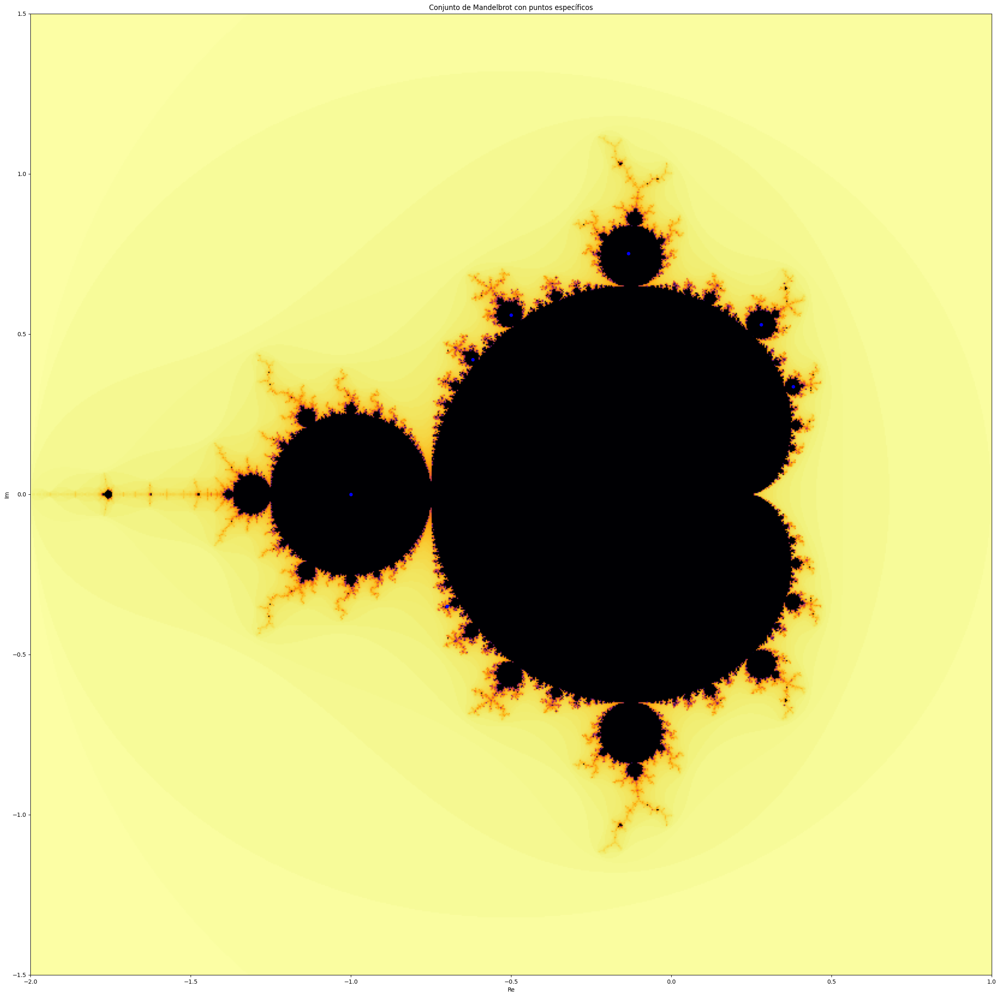

In [1]:
import numpy as np
import matplotlib.pyplot as plt

def mandelbrot(c, max_iter=100):
    z = 0
    for n in range(max_iter):
        if abs(z) > 2:
            return n
        z = z*z + c
    return max_iter

def mandelbrot_set(xmin, xmax, ymin, ymax, width, height, max_iter):
    x = np.linspace(xmin, xmax, width)
    y = np.linspace(ymin, ymax, height)
    result = np.zeros((height, width))
    
    for i in range(height):
        for j in range(width):
            result[i, j] = mandelbrot(complex(x[j], y[i]), max_iter)
    
    return result

# Parámetros del gráfico
xmin, xmax, ymin, ymax = -2, 1, -1.5, 1.5
width, height = 800, 800
max_iter = 150

# Generar el conjunto de Mandelbrot
mandelbrot_img = mandelbrot_set(xmin, xmax, ymin, ymax, width, height, max_iter)

# Puntos especificados
points = [(-1, 0), (-0.1342, 0.7516), (0.28, 0.53), (-0.5, 0.56), 
          (0.38, 0.336), (-0.62, 0.42), (-0.70, -0.35)]

# Graficar el resultado
plt.figure(figsize=(30, 30))
plt.imshow(mandelbrot_img, extent=(xmin, xmax, ymin, ymax), cmap='inferno_r', origin='lower')

# Marcar los puntos
for px, py in points:
    plt.plot(px, py, 'bo', markersize=5, label=f'({px}, {py})')

plt.title("Conjunto de Mandelbrot con puntos específicos")
plt.xlabel("Re")
plt.ylabel("Im")
plt.show()


**Menu con imagen**

In [ ]:
import tkinter as tk
import subprocess
from PIL import Image, ImageTk  # Necesita instalarse con `pip install pillow`

# Función para ejecutar un archivo .py
def ejecutar_script(script):
    subprocess.run(["python", script])

# Función para centrar la ventana en la pantalla
def centrar_ventana(ventana, ancho=1000, alto=650):
    ventana.update_idletasks()
    pantalla_ancho = ventana.winfo_screenwidth()
    pantalla_alto = ventana.winfo_screenheight()
    
    x = (pantalla_ancho - ancho) // 2
    y = (pantalla_alto - alto) // 2

    ventana.geometry(f"{ancho}x{alto}+{x}+{y}")

# Crear la ventana principal
root = tk.Tk()
root.title("Menú de Scripts")

# Centrar la ventana
centrar_ventana(root)

# Frame principal para organizar la imagen y los botones
frame = tk.Frame(root)
frame.pack(pady=10, padx=10)

# Cargar la imagen
ruta_imagen = "mandelbrot_final.png"  # Cambia esto por la ruta de tu imagen
img = Image.open(ruta_imagen)
img = img.resize((800, 600))  # Ajustar tamaño
imagen_tk = ImageTk.PhotoImage(img)

# Etiqueta para mostrar la imagen
label_imagen = tk.Label(frame, image=imagen_tk)
label_imagen.grid(row=0, column=0, rowspan=7, padx=10)

# Lista de archivos .py
scripts = ["pro.py", "parte2.py", "parte3.py", "parte4.py", "parte5.py", "parte6.py", "parte7.py"]

# Crear los botones y alinearlos en columna
for i, script in enumerate(scripts):
    btn = tk.Button(frame, text=f"Abrir {script}", command=lambda s=script: ejecutar_script(s))
    btn.grid(row=i, column=1, pady=5, padx=10)

# Ejecutar la ventana
root.mainloop()



**codigo para cada punto con la tabla oculta por zoom**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros iniciales de la imagen
width, height = 800, 800
x_min, x_max = -1.5, 1.5
y_min, y_max = -1, 1
max_iter = 150  # Número máximo de iteraciones

# Definir un valor fijo para C
C_fixed = complex(-0.70, -0.35)

# Función para calcular el conjunto de Julia
def compute_julia_set(x_min, x_max, y_min, y_max, width, height, max_iter, C_fixed):
    x_values = np.linspace(x_min, x_max, width)
    y_values = np.linspace(y_min, y_max, height)
    julia_set = np.zeros((height, width))

    for i, y in enumerate(y_values):
        for j, x in enumerate(x_values):
            Z = complex(x, y)  # Cada punto en la cuadrícula
            C = C_fixed  # Se usa el mismo C en todas las iteraciones
            iter_count = 0
            while abs(Z) <= 2 and iter_count < max_iter:
                Z = Z**2 + C
                iter_count += 1
            julia_set[i, j] = iter_count

    return julia_set

# Función para redibujar la imagen con nuevos límites
def redraw_julia_set(x_min, x_max, y_min, y_max):
    # Calcular el nuevo conjunto de Julia
    julia_set = compute_julia_set(x_min, x_max, y_min, y_max, width, height, max_iter, C_fixed)

    # Actualizar la imagen
    im.set_data(julia_set)
    im.set_extent([x_min, x_max, y_min, y_max])

    # Actualizar los límites de los ejes
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)

    # Redibujar las iteraciones
    for scatter in ax.collections:
        scatter.remove()  # Eliminar los puntos anteriores
    for text in ax.texts:
        text.remove()  # Eliminar los textos anteriores

    # Agregar las primeras 8 iteraciones como puntos blancos (sin etiquetas de iteración)
    for i, (x, y) in enumerate(iterations[:-1]):
        if x_min <= x <= x_max and y_min <= y <= y_max:  # Asegurar que esté dentro del área de la imagen
            ax.scatter(x, y, color='white', marker='o', s=30)  # Eliminado el parámetro `label`
            ax.text(x, y, f'P{i} ({x:.2f}, {y:.2f})', fontsize=12, color='white', ha='right', va='bottom')

    # Eliminar la tabla si existe
    global table
    if table is not None:
        table.remove()
        table = None

    # Redibujar la figura
    plt.draw()

# Función para manejar el evento de zoom con el mouse
def on_press(event):
    global x_min, x_max, y_min, y_max
    if event.button == 1:  # Botón izquierdo del ratón (zoom hacia adentro)
        x_center, y_center = event.xdata, event.ydata
        if x_center is not None and y_center is not None:
            # Calcular nuevos límites para hacer zoom hacia adentro
            zoom_factor = 0.5  # Factor de zoom (ajustable)
            x_range = (x_max - x_min) * zoom_factor
            y_range = (y_max - y_min) * zoom_factor
            x_min, x_max = x_center - x_range / 2, x_center + x_range / 2
            y_min, y_max = y_center - y_range / 2, y_center + y_range / 2
            redraw_julia_set(x_min, x_max, y_min, y_max)

    elif event.button == 3:  # Botón derecho del ratón (zoom hacia afuera)
        x_center, y_center = event.xdata, event.ydata
        if x_center is not None and y_center is not None:
            # Calcular nuevos límites para hacer zoom hacia afuera
            zoom_factor = 2.0  # Factor de zoom (ajustable)
            x_range = (x_max - x_min) * zoom_factor
            y_range = (y_max - y_min) * zoom_factor
            x_min, x_max = x_center - x_range / 2, x_center + x_range / 2
            y_min, y_max = y_center - y_range / 2, y_center + y_range / 2
            redraw_julia_set(x_min, x_max, y_min, y_max)

# Calcular las primeras 8 iteraciones de Z_n para C_fixed
C = C_fixed
Z = complex(0, 0)  # Z0
iterations = [(Z.real, Z.imag)]  # Lista para almacenar las coordenadas de las iteraciones
for i in range(8):
    Z = Z**2 + C
    iterations.append((Z.real, Z.imag))

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(40, 40))  # Tamaño constante de la figura
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)

# Dibujar el conjunto de Julia inicial
julia_set = compute_julia_set(x_min, x_max, y_min, y_max, width, height, max_iter, C_fixed)
im = ax.imshow(julia_set, extent=[x_min, x_max, y_min, y_max], cmap='jet_r', origin='lower')

# Agregar las primeras 8 iteraciones como puntos blancos (sin etiquetas de iteración)
for i, (x, y) in enumerate(iterations[:-1]):
    if x_min <= x <= x_max and y_min <= y <= y_max:  # Asegurar que esté dentro del área de la imagen
        ax.scatter(x, y, color='white', marker='o', s=30)  # Eliminado el parámetro `label`
        ax.text(x, y, f'P{i} ({x:.2f}, {y:.2f})', fontsize=12, color='white', ha='right', va='bottom')

# Agregar cuadrícula y ejes cartesianos
ax.axhline(0, color='white', linewidth=1.2)  # Eje X
ax.axvline(0, color='white', linewidth=1.2)  # Eje Y
ax.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.6)  # Cuadrícula

# Establecer marcas en los ejes cada 0.1 unidades
ax.set_xticks(np.arange(x_min, x_max + 0.1, 0.1))
ax.set_yticks(np.arange(y_min, y_max + 0.1, 0.1))

# Etiquetas
ax.set_title(f"Conjunto de Julia con C = {C_fixed}")
ax.set_xlabel("Re(Z)")
ax.set_ylabel("Im(Z)")

# Crear una tabla con las iteraciones
col_labels = ["Iteración", "Re(Z)", "Im(Z)"]
table_data = [(f'P{i}', f'{x:.4f}', f'{y:.4f}') for i, (x, y) in enumerate(iterations)]
table = ax.table(cellText=table_data, colLabels=col_labels, cellLoc='center', loc='upper right', bbox=[0.65, 0.6, 0.3, 0.3])
table.auto_set_font_size(False)
table.set_fontsize(10)

# Conectar el evento de clic del ratón
fig.canvas.mpl_connect('button_press_event', on_press)

# Mostrar la gráfica
plt.show()